This notebook is the Synthetic generation and Augmentation part build on refiendweb xxx

In [ ]:
## To check your memory
# !nvidia-smi
# from psutil import virtual_memory
# print(virtual_memory().total/1e9, "GB RAM")

# 1 Notebook Setup



In [ ]:
# Added all in requirement
!pip install spacy
!pip install keybert
!pip install sentence-transformers
!pip install -q tqdm            # run once in Colab / Jupyter

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 102.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 67.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 99.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [ ]:
# Core Python Utilities
from collections import Counter       # Count frequencies of elements
from pathlib import Path              # Filesystem paths (e.g., Path("data/file.csv"))
import ast                            # Safe literal parsing (e.g., from string to dict)
import re                             # Regular expressions
import numpy as np                    # Array computing and math ops
import pandas as pd                   # DataFrame operations
import psutil                         # System/process utilities (e.g., memory usage)

# Progress & Performance
from tqdm import tqdm                 # Progress bars for loops

# Visualization
import matplotlib.pyplot as plt       # General plotting
import seaborn as sns                 # Statistical visualization
from matplotlib import cm             # Colormaps
from matplotlib.colors import Normalize  # Normalize values for color scaling
from wordcloud import WordCloud       # Generate word clouds
from IPython.display import display, HTML  # Display tables and HTML content in notebooks
import plotly.express as px           # Interactive plotting (optional)

# Math & Statistics
from scipy.special import softmax     # Convert logits to probabilities
from scipy.stats import spearmanr     # Rank correlation coefficient

# NLP & Transformers
import spacy                          # NLP pipeline (tokenization, NER, POS, etc.)
import torch                          # Tensor operations (backend for transformers)
from transformers import (            # HuggingFace Transformers
    AutoModelForSequenceClassification,
    AutoTokenizer,
    pipeline
)

# Embeddings & Keyword Extraction
from keybert import KeyBERT                       # Keyword extraction using embeddings
from sentence_transformers import SentenceTransformer  # Sentence embeddings (e.g., MiniLM)

In [ ]:
from tqdm.notebook import tqdm   # notebook-friendly progress bar
tqdm.pandas()                    # enable progress_apply()

In [ ]:
# (optional) if run in Google Collab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load the data
df = pd.read_parquet('/content/drive/MyDrive/pretrained_refinedweb_updated_shared/before_sentiment_all_brands.parquet')

In [ ]:
df.head()

,doc_id,content,url,timestamp,image_urls,brand_name,year
0,21,tuesday april colour pakistan favorite collect...,http://couturebano.blogspot.com/2012/,2017-04-23 12:42:59,[],H&M,2017
1,24,story rachel well photo ken irwin ken th janua...,http://www.theage.com.au/victoria/uniqlo-gives...,2014-09-15 04:33:28,[],Zara,2014
2,63,learn style watch people runway happen every m...,http://www.styledintofashion.com/2014/03/doubl...,2019-10-14 04:47:46,[],Zara,2019
3,74,prweb august cream specialist medium agency pr...,https://www.prweb.com/releases/2013/8/prweb110...,2019-04-18 12:35:29,[],Burberry,2019
4,79,undated several store south africa temporarily...,https://www.1043theparty.com/2018/01/15/hm-sou...,2018-09-18 19:15:47,[],H&M,2018


In [ ]:
num_rows = df.shape[0]           # inline: .shape[0] returns the number of rows
print(f"Total rows: {num_rows}")                    # inline: display the row count

Total rows: 13524


# 2 Sentiment Analysis Using Sentiment Engine

#### Sentiment Engine · [RoBERTa-large (3-class)](https://huggingface.co/j-hartmann/sentiment-roberta-large-english-3-classes)
**`j-hartmann/sentiment-roberta-large-english-3-classes`**

| Aspect | Details |
|--------|---------|
| **Background** | RoBERTa-large, fine-tuned on 5,304 hand-labelled social-media posts; 3 classes (positive / neutral / negative); hold-out accuracy ≈ 86 % :contentReference[oaicite:0]{index=0} |
| **Benefits** | • Three-way output gives nuance<br>• Provides per-class confidence scores<br>• Strong on informal English typical of comments & reviews<br>• Works out-of-the-box with `transformers` pipeline |
| **Fit for fashion-retail webpages** | Ideal for classifying user reviews, blog comments, or UGC about brands (Zara, H&M, etc.); confidence scores let you flag content needing manual follow-up; easy to embed in Python, Spark or JS pipelines |
| **Limitations** | Small training set → may miss domain slang (“fit”, “haul”); no sarcasm handling; English-only; not tuned for very long product pages (truncate >512 tokens) |

<!-- Blue note box -->
<div style="border-left:4px solid #2196f3; background:#e3f2fd; padding:12px; font-family:sans-serif;">
  <strong>Note:</strong> This code block is intentionally hidden because it takes a long time to run. You can skip it and proceed directly to the data-download in next steps instead, The project use Google Colab to run sentiment analysis as T4 GPU available but Ai8 have only CPU, The code below provided similarly when running in different environment with fixed version control and configuration of requirement. After getting results, we explored the data on Ai8 and filtering only positive sentiment with high confidence on Ai8
</div>

In [ ]:
# # Load pipeline
# sentiment_model = pipeline(
#     "sentiment-analysis",
#     model="j-hartmann/sentiment-roberta-large-english-3-classes",
#     device=0  # or -1 for CPU
# )
# tokenizer = sentiment_model.tokenizer

# # Map label to score
# label_to_score = {'negative': -1, 'neutral': 0, 'positive': 1}

# # Fixed chunker (no duplicate kwargs)
# def tokenize_chunks(text, max_tokens=512, stride=50):
#     enc = tokenizer(
#         text,
#         return_attention_mask=False,
#         return_token_type_ids=False,
#         return_overflowing_tokens=True,
#         truncation=True,
#         max_length=max_tokens,
#         stride=stride,
#         return_offsets_mapping=False
#     )
#     return [
#         tokenizer.decode(ids, skip_special_tokens=True)
#         for ids in enc["input_ids"]
#     ]

# # Compute average sentiment
# def compute_avg_sentiment(text):
#     chunks = tokenize_chunks(text)
#     if not chunks:
#         return {'sentiment_label': 'neutral', 'confidence': 0.0, 'sentiment_score': 0.0}

#     results = sentiment_model(chunks, truncation=True)
#     scores = [label_to_score[r['label'].lower().replace("label_", "")] for r in results]
#     confidences = [r['score'] for r in results]

#     avg_score = float(np.mean(scores))
#     avg_confidence = float(np.mean(confidences))

#     if avg_score > 0.1:
#         final_label = 'positive'
#     elif avg_score < -0.1:
#         final_label = 'negative'
#     else:
#         final_label = 'neutral'

#     return {
#         'sentiment_label': final_label,
#         'confidence': round(avg_confidence, 4),
#         'sentiment_score': round(avg_score, 4)
#     }


In [ ]:
# # Apply sentiment to DataFrame
# tqdm.pandas()
# df_sentiment_pd[['sentiment_label','sentiment_score','confidence']] = (
#     df_sentiment_pd['content']
#     .progress_apply(compute_avg_sentiment)
#     .apply(pd.Series)
# )

## Save as a checkpoint

**Note:** The code block below might have been intentionally hidden to prevent unintentional multiple downloads during testing of the dataset. This is a best practice to avoid redundant operations that may consume unnecessary resources or lead to duplicate file writes.

In [ ]:
# output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/after_sentiment_all_brands.parquet")
# df_sentiment_pd.to_csv(output_path, index=False)

In [ ]:
# Load the data
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/after_sentiment_all_brands.csv")
df = pd.read_csv(output_path)

In [ ]:
df["brand_name"] = df["brand_name"].str.lower().str.strip()

In [ ]:
# Each sentiment label
df["sentiment_label"].value_counts()

,count
sentiment_label,
neutral,9492
positive,3441
negative,591


In [ ]:
# Round average columns to two decimal places
brand_sentiment_summary = (
    df.groupby('brand_name')
      .agg(
          avg_sentiment_score=('sentiment_score', 'mean'),
          avg_confidence=('confidence', 'mean'),
          count=('sentiment_score', 'count')
      )
      .reset_index()
      .round({'avg_sentiment_score': 3, 'avg_confidence': 3})
      .sort_values('avg_sentiment_score', ascending=False)  # sort by average sentiment
)

In [ ]:
brand_sentiment_summary

,brand_name,avg_sentiment_score,avg_confidence,count
0,burberry,0.970,0.125,1212
1,h&m,0.967,0.196,8568
3,zara,0.966,0.206,2541
2,primark,0.959,0.341,1203


## Fitlering out Negative sentiment

In [ ]:
df.head()

,doc_id,content,url,timestamp,image_urls,brand_name,year,sentiment_label,sentiment_score,confidence
0,21,tuesday april colour pakistan favorite collect...,http://couturebano.blogspot.com/2012/,2017-04-23 12:42:59,[],h&m,2017,neutral,0.9604,0.0
1,24,story rachel well photo ken irwin ken th janua...,http://www.theage.com.au/victoria/uniqlo-gives...,2014-09-15 04:33:28,[],zara,2014,neutral,0.9983,0.0
2,63,learn style watch people runway happen every m...,http://www.styledintofashion.com/2014/03/doubl...,2019-10-14 04:47:46,[],zara,2019,neutral,0.9986,0.0
3,74,prweb august cream specialist medium agency pr...,https://www.prweb.com/releases/2013/8/prweb110...,2019-04-18 12:35:29,[],burberry,2019,neutral,0.9992,0.0
4,79,undated several store south africa temporarily...,https://www.1043theparty.com/2018/01/15/hm-sou...,2018-09-18 19:15:47,[],h&m,2018,negative,0.9773,-1.0


In [ ]:
# Filter out negative sentiment & keep sentiment_score > 0.7
score_threshold = 0.7
filtered_df = (
    df.loc[(df["sentiment_label"] != "negative") & (df["sentiment_score"].abs() > score_threshold)]
      .reset_index(drop=True)
)

# Quick check
print(f"{len(filtered_df)} rows retained out of {len(df)}")
filtered_df.head()

12502 rows retained out of 13524


,doc_id,content,url,timestamp,image_urls,brand_name,year,sentiment_label,sentiment_score,confidence
0,21,tuesday april colour pakistan favorite collect...,http://couturebano.blogspot.com/2012/,2017-04-23 12:42:59,[],h&m,2017,neutral,0.9604,0.0
1,24,story rachel well photo ken irwin ken th janua...,http://www.theage.com.au/victoria/uniqlo-gives...,2014-09-15 04:33:28,[],zara,2014,neutral,0.9983,0.0
2,63,learn style watch people runway happen every m...,http://www.styledintofashion.com/2014/03/doubl...,2019-10-14 04:47:46,[],zara,2019,neutral,0.9986,0.0
3,74,prweb august cream specialist medium agency pr...,https://www.prweb.com/releases/2013/8/prweb110...,2019-04-18 12:35:29,[],burberry,2019,neutral,0.9992,0.0
4,87,abenblatt find singer bill guitarist tom kauli...,http://thtokiohotelfans.blogspot.com/2009/05/h...,2019-02-16 06:29:00,[],h&m,2019,neutral,0.9990,0.0


In [ ]:
# Each sentiment label
filtered_df["sentiment_label"].value_counts()

,count
sentiment_label,
neutral,9259
positive,3243


In [ ]:
filtered_df.count()

,0
doc_id,12502
content,12502
url,12502
timestamp,12502
image_urls,12502
brand_name,12502
year,12502
sentiment_label,12502
sentiment_score,12502
confidence,12502


In [ ]:
# Round average columns to two decimal places
brand_sentiment_summary_neu_and_pos = (
    filtered_df
        .groupby("brand_name", as_index=False)
        .agg(
            avg_sentiment_score=("sentiment_score", "mean"),
            avg_confidence     =("confidence",      "mean"),
            count              =("sentiment_score", "size"),
        )
        .round({"avg_sentiment_score": 3, "avg_confidence": 3})
        .sort_values("avg_sentiment_score", ascending=False)
)


In [ ]:
brand_sentiment_summary_neu_and_pos
print(f"{len(brand_sentiment_summary_neu_and_pos)} rows retained out of {len(filtered_df)}")

4 rows retained out of 12502


In [ ]:
# Add back to replace the old dataframe
df = filtered_df

In [ ]:
print(f"{len(brand_sentiment_summary_neu_and_pos)} rows retained out of {len(df)}")

4 rows retained out of 12502


In [ ]:
# Each sentiment label
df["sentiment_label"].value_counts()

,count
sentiment_label,
neutral,9259
positive,3243


## Save As Checkpoint

**Note:** The code block below might have been intentionally hidden to prevent unintentional multiple downloads during testing of the dataset. This is a best practice to avoid redundant operations that may consume unnecessary resources or lead to duplicate file writes.

In [ ]:
# Save the data
# output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/after_sentiment_all_brands_pos_and_neu_high_sent.csv")
# df.to_csv(output_path, index=False)

# 3 Top Keyword Model

In [ ]:
# Load the data
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/after_sentiment_all_brands_pos_and_neu_high_sent.csv")
df = pd.read_csv(output_path)

In [ ]:
df["sentiment_label"].value_counts()

,count
sentiment_label,
neutral,9259
positive,3243


### What is `KeyBERT`?

`KeyBERT` is a Python library for extracting **keywords or keyphrases** from text using **BERT-based embeddings**.

### KeyBERT Overview

This initializes a `KeyBERT` model using `all-MiniLM-L6-v2`, a fast and efficient sentence embedding model from SentenceTransformers.

#### How It Works

1. The full document is embedded using a BERT-like model.
2. Candidate phrases from the document are also embedded.
3. Cosine similarity is calculated between the document and each candidate phrase.
4. The most similar phrases are returned as keywords.

#### Benefits

- Works out-of-the-box with no training required
- Context-aware keyword extraction
- Fast and lightweight with MiniLM
- Supports multiple ranking strategies (e.g., MMR, MaxSum)


#### Limitations

- Extractive only (selects words from the text, does not generate)
- Quality depends on the input and the embedding model
- May include off-topic results in short or noisy texts
- Limited performance on non-English texts without proper models


# `top_n` and `stop_words` in KeyBERT

When using `KeyBERT` to extract keywords, you can control the output with parameters like `top_n` and `stop_words`.

#### `top_n`

- Specifies how many **top-ranked keywords** you want to extract.
- It returns only the top `n` phrases based on their similarity score to the full document.
- We set top_n = 5 which This will return the 5 most relevant keywords/phrases.

### `stop_words`

- Removes common, non-informative words (like "the", "is", "and") from keyword candidates.
- Helps improve keyword quality by filtering out generic terms.
- Can be set to:
  - `'english'` — uses a built-in list of English stopwords
  - A **custom list** of stopwords
  - `None` — to disable stopword removal

In [ ]:
kw_model = KeyBERT(model="all-MiniLM-L6-v2")

## Word Extraction Analysis

We will cover Unigram analysis, Uni-bi analysis and Bigram analysis with the same configuration below
- stop_words = 'english'
- top_n = 5
- We will analyze 3 aspects, Unigram / Uni-bi and Bigram

<!-- Blue note box -->
<div style="border-left:4px solid #2196f3; background:#e3f2fd; padding:12px; font-family:sans-serif;">
  <strong>Note:</strong> This code block is intentionally hidden because it takes a long time to run. You can skip it and proceed directly to the data-download in next steps insteadmm
</div>

## Unigram Top Keyword Extraction

In [ ]:
# Config 1: N-gram = (1, 1)
df['kw_unigram'] = df['content'].progress_apply(
    lambda x: [kw[0] for kw in kw_model.extract_keywords(x, keyphrase_ngram_range=(1, 1), stop_words='english', top_n=5)]
)

  0%|          | 0/12502 [00:00<?, ?it/s]

## Save As Checkpoint

**Note:** The code block below might have been intentionally hidden to prevent unintentional multiple downloads during testing of the dataset. This is a best practice to avoid redundant operations that may consume unnecessary resources or lead to duplicate file writes.

In [ ]:
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/neu_and_pos_high_sent-nlp-added-features-unigram.csv")
# df.to_csv(output_path, index=False)

## Uni-Bigram Top Keyword Extraction

In [ ]:
# Config 2: N-gram = (1, 2)
df['kw_uni_bi'] = df['content'].progress_apply(
    lambda x: [kw[0] for kw in kw_model.extract_keywords(x, keyphrase_ngram_range=(1, 2), stop_words='english', top_n=5)]
)

  0%|          | 0/12502 [00:00<?, ?it/s]

## Save As Checkpoint

**Note:** The code block below might have been intentionally hidden to prevent unintentional multiple downloads during testing of the dataset. This is a best practice to avoid redundant operations that may consume unnecessary resources or lead to duplicate file writes.

In [ ]:
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/neu_and_pos_high_sent-nlp-added-features-uni-bi.csv")
# df.to_csv(output_path, index=False)

## Bigram Top Keyword Extraction

## Save As Checkpoint

In [ ]:
# Config 3: N-gram = (2, 2) only phrases
df['kw_bigram'] = df['content'].progress_apply(
    lambda x: [kw[0] for kw in kw_model.extract_keywords(x, keyphrase_ngram_range=(2, 2), stop_words='english', top_n=5)]
)

  0%|          | 0/12502 [00:00<?, ?it/s]

## Save as a checkpoint

**Note:** The code block below might have been intentionally hidden to prevent unintentional multiple downloads during testing of the dataset. This is a best practice to avoid redundant operations that may consume unnecessary resources or lead to duplicate file writes.

In [ ]:
# output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/neu_and_pos_high_sent-nlp-added-features-bi.csv")
# df.to_csv(output_path, index=False)

# 4 Keyword Exploration

In [ ]:
# Load the data
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/neu_and_pos_high_sent-nlp-added-features-bi.csv")
df = pd.read_csv(output_path)

In [ ]:
df.head()

,doc_id,content,url,timestamp,image_urls,brand_name,year,sentiment_label,sentiment_score,confidence,kw_unigram,kw_uni_bi,kw_bigram
0,21,tuesday april colour pakistan favorite collect...,http://couturebano.blogspot.com/2012/,2017-04-23 12:42:59,[],H&M,2017,neutral,0.9604,0.0,"['bunto', 'kazmi', 'april', 'march', 'umar']","['bunto kazmi', 'kazmi friday', 'bunto', 'coll...","['bunto kazmi', 'kazmi friday', 'collection bu..."
1,24,story rachel well photo ken irwin ken th janua...,http://www.theage.com.au/victoria/uniqlo-gives...,2014-09-15 04:33:28,[],Zara,2014,neutral,0.9983,0.0,"['retailer', 'shopper', 'merchandiser', 'melbo...","['retailer australian', 'australian shopper', ...","['retailer australian', 'australian shopper', ..."
2,63,learn style watch people runway happen every m...,http://www.styledintofashion.com/2014/03/doubl...,2019-10-14 04:47:46,[],Zara,2019,neutral,0.9986,0.0,"['dress', 'harlow', 'style', 'monochrome', 'sh...","['style watch', 'blouse bag', 'leather monochr...","['style watch', 'blouse bag', 'leather monochr..."
3,74,prweb august cream specialist medium agency pr...,https://www.prweb.com/releases/2013/8/prweb110...,2019-04-18 12:35:29,[],Burberry,2019,neutral,0.9992,0.0,"['consumer', 'shopper', 'retailer', 'brand', '...","['consumer track', 'brand attract', 'attract s...","['consumer track', 'brand attract', 'attract s..."
4,87,abenblatt find singer bill guitarist tom kauli...,http://thtokiohotelfans.blogspot.com/2009/05/h...,2019-02-16 06:29:00,[],H&M,2019,neutral,0.9990,0.0,"['singer', 'artist', 'designer', 'yoko', 'bass...","['artist katy', 'kaulitz drummer', 'singer', '...","['artist katy', 'kaulitz drummer', 'drummer gu..."


In [ ]:
num_rows = df.shape[0]           # inline: .shape[0] returns the number of rows
print(f"Total rows: {num_rows}")                    # inline: display the row count

Total rows: 12502


# Top keywords by brand Analysis

## Unigram

### Overall top keyword - Bar chart

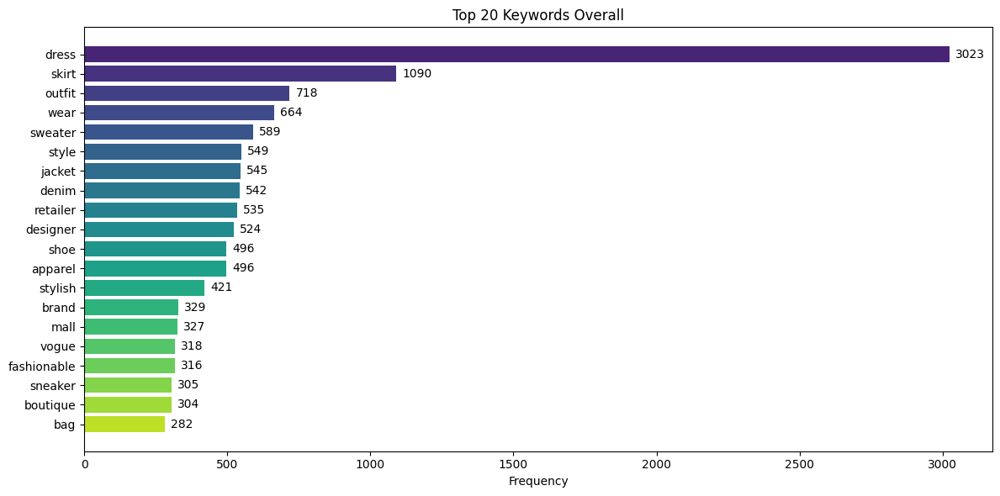

In [ ]:
all_keywords = [kw for kws in df['kw_unigram'] for kw in eval(kws)]
keyword_counts = Counter(all_keywords)
top_keywords = keyword_counts.most_common(20)
labels, values = zip(*top_keywords)

cmap = plt.get_cmap('viridis')                      # or 'plasma', 'cividis', etc.
colors = cmap(np.linspace(0.1, 0.9, len(labels)))   # avoid extremes of the colormap

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(labels[::-1], values[::-1], color=colors[::-1])

ax.bar_label(bars, labels=[f"{v}" for v in values[::-1]], padding=5, fontsize=10)

ax.set_title("Top 20 Keywords Overall")
ax.set_xlabel("Frequency")
plt.tight_layout()
plt.show()

###  Overall top keyword - Bar chart (Filtering out of neutral keyword of fashion product)

In [ ]:
# Neutral fashion/retail words (expanded)
neutral_words = {
    'blouse', 'bag', 'cardigan', 'coat', 'delivery', 'denim', 'discount',
    'dress', 'fashion', 'fit', 'jacket', 'jeans', 'look', 'pants', 'price',
    'return', 'sale', 'shirt', 'shop', 'shopping', 'shorts', 'skirt', 'style',
    'sweater', 't-shirt', 'trousers', 'trend', 'outfit', 'wear', 'shoe',
    'sneaker', 'garment', 'footwear', 'brand', 'sleeve',
    'necklace', 'lipstick', 'worn', 'makeup', 'tights',
    'belt', 'sunglasses', 'colour', 'pink', 'warm', 'shopper',

    # Irrelevant words to remove
    'restaurant', 'hotel', 'retailer', 'supermarket', 'consumer', 'apparel',
    'industry', 'casino', 'royal', 'market', 'grocery', 'city',
    'blog', 'demand', 'marketing', 'jewelry', 'perfume', 'fragrance', 'scent',
    'stylish', 'legging', 'boutique',

    # Additional words - human judgement
    'balmain', 'dress dress', 'mall', 'eyeshadow', 'bag, glamour', 'nordstrom',
    'leather bag', 'dress shoe', 'designer bag', 'designer handbag',
    'American apparel', 'skirt bag', 'necklace topshop', 'skirt topshop',
    'charity shop'
}

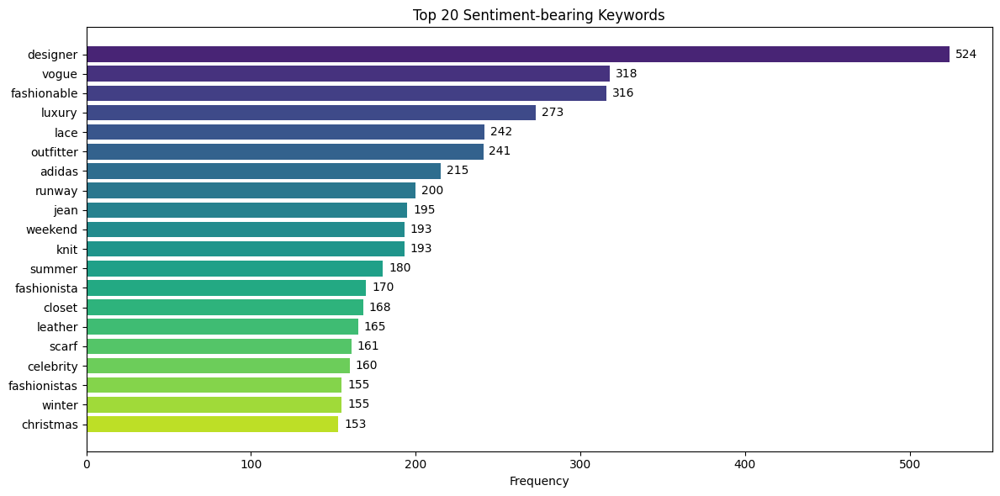

In [ ]:
all_keywords = [
    kw
    for kws in df['kw_unigram']
    for kw in eval(kws)
    if kw not in neutral_words
]

keyword_counts = Counter(all_keywords)
top_keywords = keyword_counts.most_common(20)
labels, values = zip(*top_keywords)

cmap = plt.get_cmap('viridis')
colors = cmap(np.linspace(0.1, 0.9, len(labels)))

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(labels[::-1], values[::-1], color=colors[::-1])
ax.bar_label(bars, labels=[f"{v}" for v in values[::-1]], padding=5, fontsize=10)

ax.set_title("Top 20 Sentiment‐bearing Keywords")
ax.set_xlabel("Frequency")
plt.tight_layout()
plt.show()


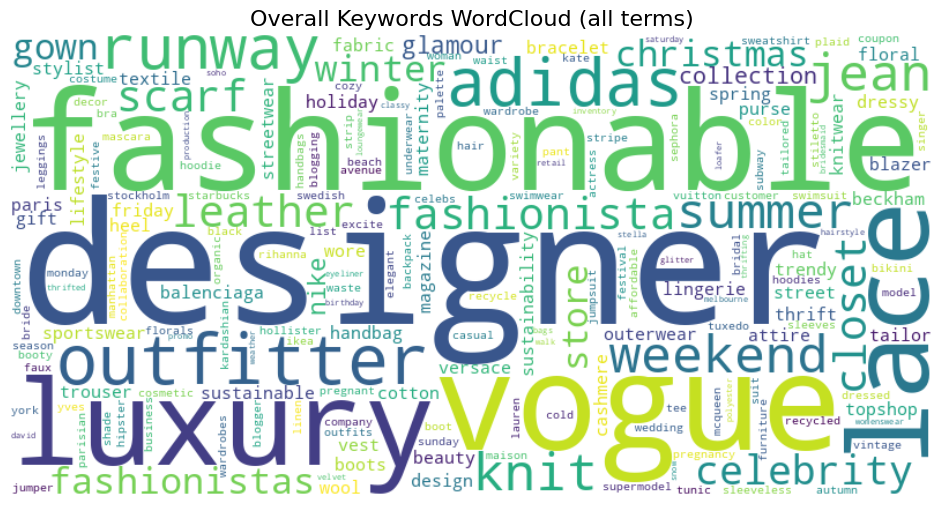

In [ ]:
# Flatten all keywords (excluding neutrals) into one big list
all_keywords = [
    kw
    for kws in df['kw_unigram']
    for kw in eval(kws)
    if kw not in neutral_words
]

# Count frequencies of every keyword
keyword_counts = Counter(all_keywords)

# Generate the WordCloud from the full frequency dict
wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='viridis',      # or any other cmap you prefer
    prefer_horizontal=0.9
).generate_from_frequencies(keyword_counts)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Overall Keywords WordCloud (all terms)", fontsize=16)
plt.show()

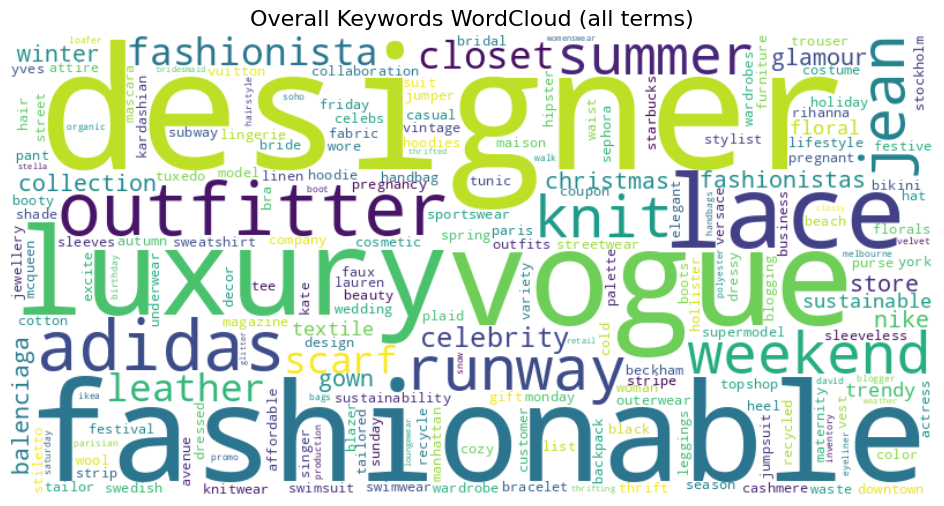

In [ ]:
# Flatten all keywords (excluding neutrals) into one big list
all_keywords = [
    kw
    for kws in df['kw_unigram']
    for kw in eval(kws)
    if kw not in neutral_words
]

# Count frequencies of every keyword
keyword_counts = Counter(all_keywords)

# Generate the WordCloud from the full frequency dict
wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='viridis',      # or any other cmap you prefer
    prefer_horizontal=0.9
).generate_from_frequencies(keyword_counts)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Overall Keywords WordCloud (all terms)", fontsize=16)
plt.show()

## Bar Chart across brands

In [ ]:
brand_keywords = df.groupby('brand_name')['kw_unigram'].apply(
    lambda x: [kw for sublist in x for kw in eval(sublist) if kw not in neutral_words]
)

top_brand_keywords = brand_keywords.apply(lambda x: Counter(x).most_common(20))

In [ ]:
print(top_brand_keywords.index.tolist())

['Burberry', 'H&M', 'Primark', 'Zara']


In [ ]:
df["brand_name"] = df["brand_name"].str.lower().str.strip()


In [ ]:
top_brand_keywords.index = top_brand_keywords.index.str.lower().str.strip()

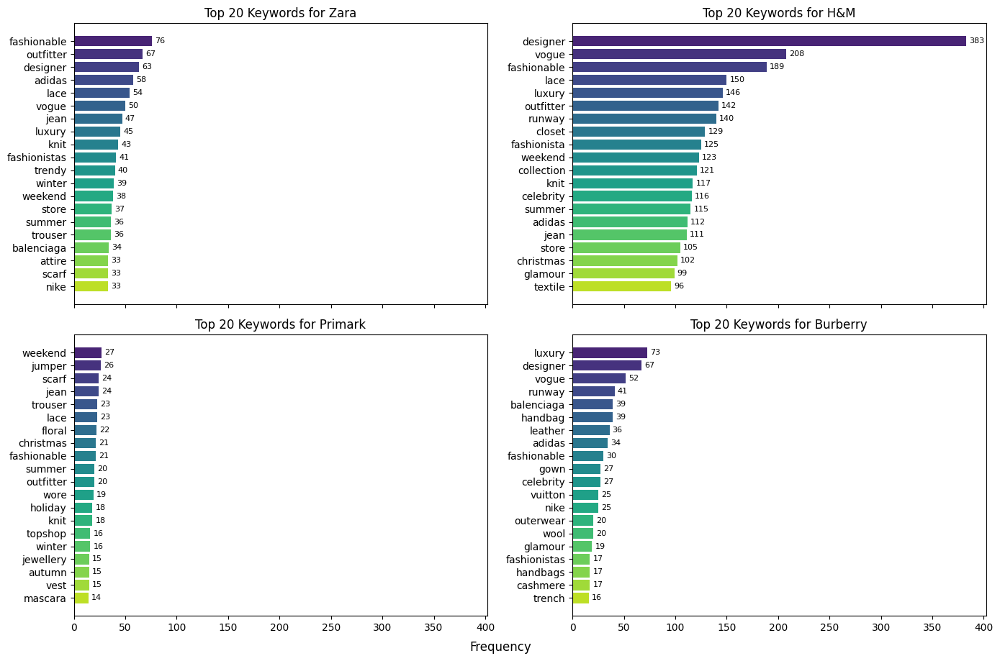

In [ ]:
# Rebuild brand_keywords with neutral words excluded:
brand_keywords = (
    df
    .groupby('brand_name')['kw_unigram']
    .apply(lambda series: [
        kw
        for kws in series
        for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# Compute top-20 per brand
top_brand_keywords = brand_keywords.apply(lambda kw_list: Counter(kw_list).most_common(20))

brands = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}

fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
axes = axes.flatten()
cmap = plt.get_cmap('viridis')

for ax, brand in zip(axes, brands):
    top20 = top_brand_keywords[brand]      # now already filtered
    labels, values = zip(*top20)

    colors = cmap(np.linspace(0.1, 0.9, len(labels)))
    bars = ax.barh(labels, values, color=colors)
    ax.bar_label(bars, labels=[str(v) for v in values], padding=3, fontsize=8)

    ax.set_title(f"Top 20 Keywords for {display_names[brand]}")
    ax.invert_yaxis()

fig.text(0.5, 0.04, 'Frequency', ha='center', fontsize=12)
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()


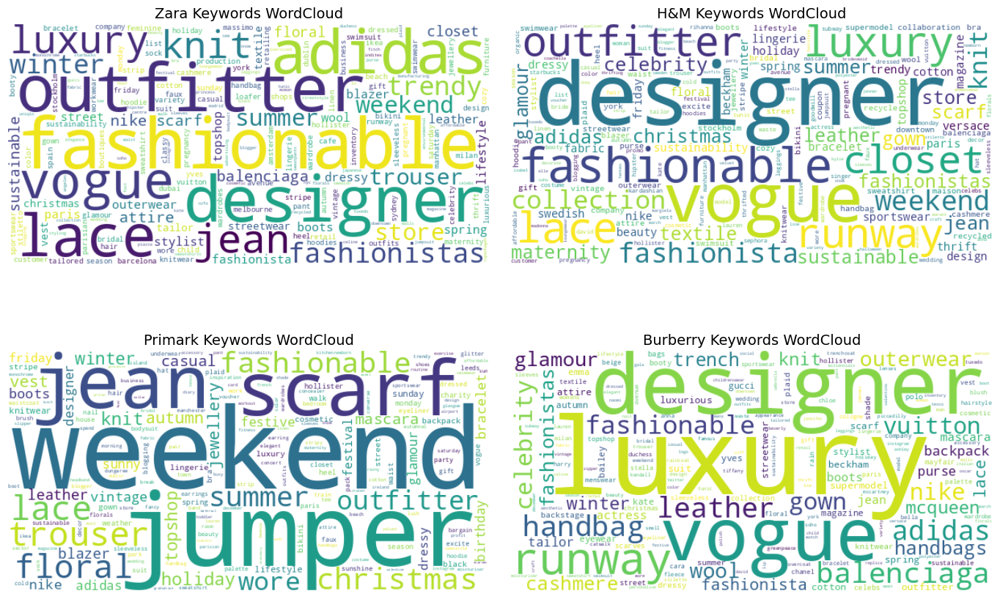

In [ ]:
brands  = ['zara', 'h&m', 'primark', 'burberry']
display = {'zara':'Zara','h&m':'H&M','primark':'Primark','burberry':'Burberry'}

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for ax, brand in zip(axes, brands):
    # Gather this brand’s keywords (excluding neutrals)
    kws = (
        df.loc[df['brand_name']==brand, 'kw_unigram']
        .apply(eval)
        .explode()
        .tolist()
    )
    kws = [kw for kw in kws if kw not in neutral_words]

    # Count every keyword for this brand
    freq = Counter(kws)

    # Build wordcloud from full dict
    wc = WordCloud(
        width=600,
        height=300,
        background_color='white',
        colormap='viridis',
        prefer_horizontal=0.9
    ).generate_from_frequencies(freq)

    #  Plot on its axis
    ax.imshow(wc, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(f"{display[brand]} Keywords WordCloud", fontsize=14)

plt.tight_layout(pad=2)
plt.show()


### Word Cloud Visuals

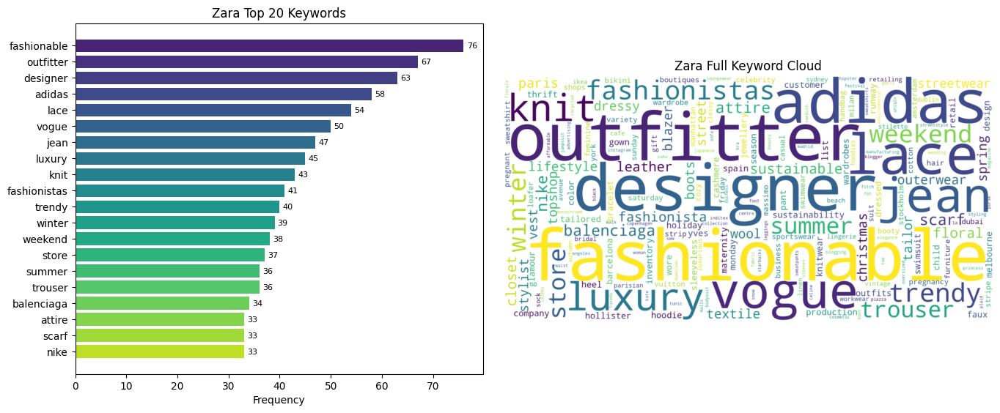

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/zara_neu_pos_high_sent_keywords.png


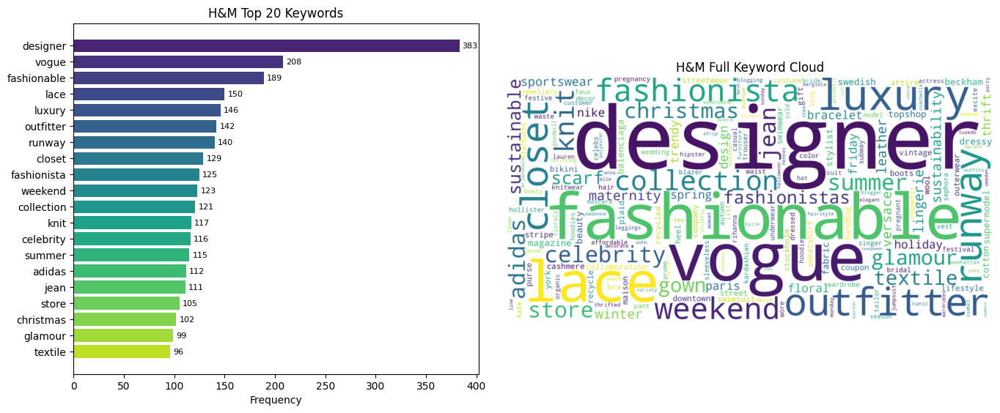

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/h&m_neu_pos_high_sent_keywords.png


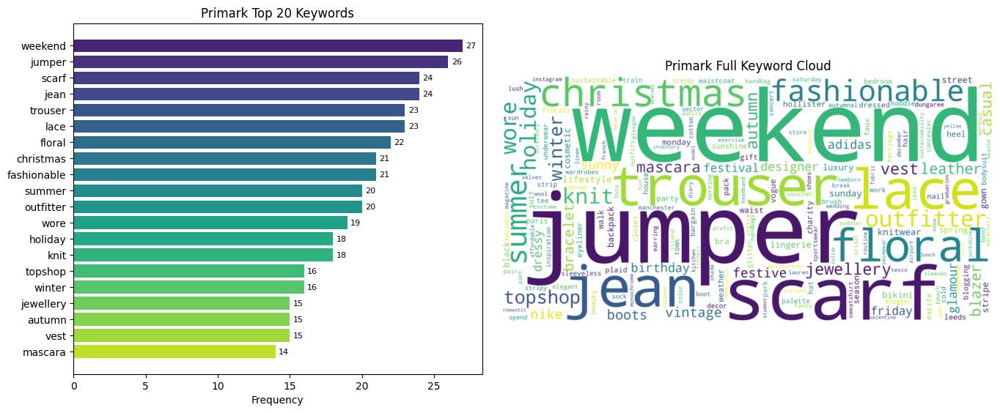

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/primark_neu_pos_high_sent_keywords.png


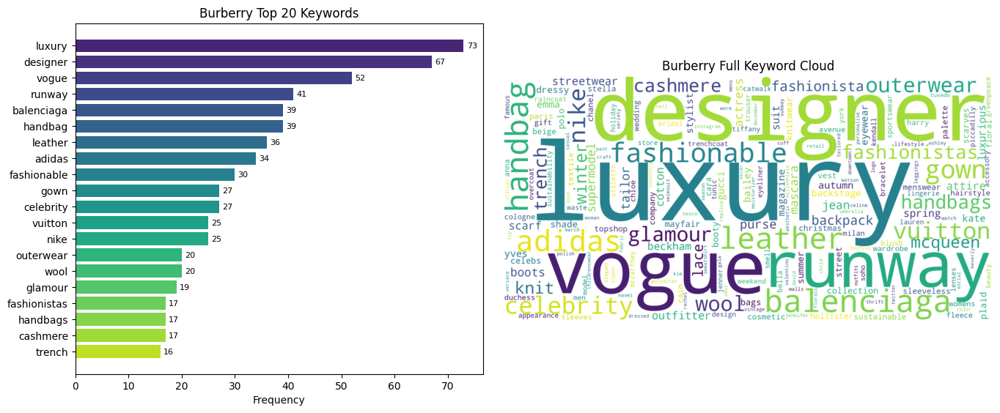

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/burberry_neu_pos_high_sent_keywords.png


In [ ]:
brands      = ['zara', 'h&m', 'primark', 'burberry']
display     = {'zara':'Zara','h&m':'H&M','primark':'Primark','burberry':'Burberry'}
neutral     = set(neutral_words)   # your neutral‐word list
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated")
output_path.mkdir(parents=True, exist_ok=True)

for brand in brands:
    # 1) gather & filter keywords
    kws = (
        df.loc[df['brand_name']==brand, 'kw_unigram']
          .apply(eval)
          .explode()
          .tolist()
    )
    kws = [kw for kw in kws if kw not in neutral]
    freq = Counter(kws)

    # 2) top-20 for bars
    top20 = freq.most_common(20)
    labels, values = zip(*top20)

    # 3) new figure with 1×2 layout
    fig, (ax_bar, ax_wc) = plt.subplots(1, 2, figsize=(14, 6),
                                        gridspec_kw={'width_ratios': [1,1.2]})

    # — Left: horizontal bar chart
    cmap = plt.get_cmap('viridis')
    colors = cmap(np.linspace(0.1, 0.9, len(values)))
    bars = ax_bar.barh(labels[::-1], values[::-1], color=colors[::-1])
    ax_bar.bar_label(bars, padding=3, fontsize=8)
    ax_bar.set_title(f"{display[brand]} Top 20 Keywords")
    ax_bar.set_xlabel("Frequency")

    # — Right: “spread‐out” wordcloud
    wc = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='viridis',
        max_words=200,
        scale=3,
        prefer_horizontal=0.5
    ).generate_from_frequencies(freq)

    ax_wc.imshow(wc, interpolation='bilinear')
    ax_wc.axis('off')
    ax_wc.set_title(f"{display[brand]} Full Keyword Cloud")

    plt.tight_layout(pad=2.0)

    # **Display inline**
    plt.show()

    # 4) save to PNG
    out_file = output_path / f"{display[brand].lower().replace(' ','_')}_neu_pos_high_sent_keywords.png"
    fig.savefig(out_file, dpi=300, bbox_inches='tight')
    plt.close(fig)

    print(f"Saved {out_file}")


### Top 30 keywords as table

In [ ]:
from IPython.display import display
# Rebuild brand_keywords with neutral words excluded
brand_keywords = (
    df
    .groupby('brand_name')['kw_unigram']
    .apply(lambda series: [
        kw for kws in series for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# 2) Decide which brands to show and how many keywords
brands        = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}
top_n = 50

# 3) Build a dict of DataFrames, keyed by the original brand string
df_top_keywords = {}

for brand in brands:
    counts    = Counter(brand_keywords[brand]).most_common(top_n)
    df_brand  = pd.DataFrame(counts, columns=['Keyword', 'Count'])
    df_top_keywords[brand] = df_brand

# 4) (Optional) unpack into four variables if you need them by name
df_top_zara      = df_top_keywords['zara']
df_top_hm        = df_top_keywords['h&m']
df_top_primark  = df_top_keywords['primark']
df_top_burberry = df_top_keywords['burberry']

# 5) Display them all
for brand, tbl in df_top_keywords.items():
    print(f"\nTop {top_n} Keywords for {display_names[brand]}")
    display(tbl)



Top 50 Keywords for Zara


,Keyword,Count
0,fashionable,76
1,outfitter,67
2,designer,63
3,adidas,58
4,lace,54
5,vogue,50
6,jean,47
7,luxury,45
8,knit,43
9,fashionistas,41



Top 50 Keywords for H&M


,Keyword,Count
0,designer,383
1,vogue,208
2,fashionable,189
3,lace,150
4,luxury,146
5,outfitter,142
6,runway,140
7,closet,129
8,fashionista,125
9,weekend,123



Top 50 Keywords for Primark


,Keyword,Count
0,weekend,27
1,jumper,26
2,scarf,24
3,jean,24
4,trouser,23
5,lace,23
6,floral,22
7,christmas,21
8,fashionable,21
9,summer,20



Top 50 Keywords for Burberry


,Keyword,Count
0,luxury,73
1,designer,67
2,vogue,52
3,runway,41
4,balenciaga,39
5,handbag,39
6,leather,36
7,adidas,34
8,fashionable,30
9,gown,27


In [ ]:
# Rebuild brand_keywords with neutral words excluded
brand_keywords = (
    df
    .groupby('brand_name')['kw_unigram']
    .apply(lambda series: [
        kw
        for kws in series
        for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# Specify brands and their display names
brands = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}
top_n = 30

# Build a DataFrame of the top-n keywords for each brand
df_top_keywords = {}
for b in brands:
    counts = Counter(brand_keywords[b]).most_common(top_n)
    df_b   = pd.DataFrame(counts, columns=['keyword', 'count'])
    df_b['brand'] = display_names[b]
    df_top_keywords[b] = df_b

# Combine all brand DataFrames into one
df_all = pd.concat(df_top_keywords.values(), ignore_index=True)

# Pivot so each brand becomes its own column of counts
pivot_df = (
    df_all
    .pivot_table(
        index='keyword',
        columns='brand',
        values='count',
        fill_value=0
    )
    .reset_index()
)

# Select keywords present in all four brands
mask_all = (pivot_df[display_names[b]] > 0 for b in brands)
common_keywords = pivot_df.loc[
    pd.concat(mask_all, axis=1).all(axis=1)
].sort_values(by=[display_names[b] for b in brands], ascending=False)

# Select keywords present in exactly one brand
mask_any = (pivot_df[display_names[b]] > 0 for b in brands)
unique_keywords = pivot_df.loc[
    pd.concat(mask_any, axis=1).sum(axis=1) == 1
].sort_values(by=[display_names[b] for b in brands], ascending=False)

In [ ]:
# Render the two tables side-by-side for reporting
html = f"""
<div style="display:flex; gap:40px;">
  <div style="flex:1;">
    <h3>Common Keywords (All 4 Brands)</h3>
    {common_keywords.to_html(index=False)}
  </div>
  <div style="flex:1;">
    <h3>Unique Keywords (Exactly One Brand)</h3>
    {unique_keywords.to_html(index=False)}
  </div>
</div>
"""
display(HTML(html))

brand,keyword,Burberry,H&M,Primark,Zara
,fashionable,30.0,189.0,21.0,76.0
,lace,15.0,150.0,23.0,54.0
,knit,15.0,117.0,18.0,43.0
,winter,15.0,85.0,16.0,39.0
,leather,36.0,88.0,13.0,28.0
brand,keyword,Burberry,H&M,Primark,Zara
,trendy,0.0,0.0,0.0,40.0
,attire,0.0,0.0,0.0,33.0
,paris,0.0,0.0,0.0,28.0
,lifestyle,0.0,0.0,0.0,27.0


### Bar chart of common keyword (%)

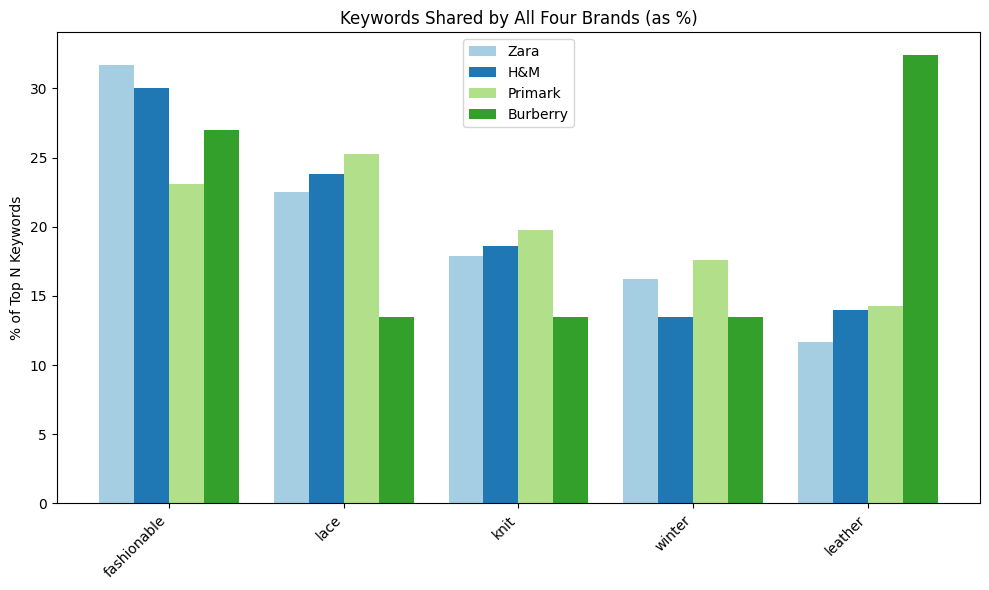

In [ ]:
# Pick up to K common keywords
K = 10
top_common = common_keywords.head(K).set_index('keyword')

# Brands & display names
brands = list(display_names.values())

# Build a (K × 4) matrix of percentages
pct_data = np.vstack([
    (top_common[brand] / top_common[brand].sum() * 100).values
    for brand in brands
]).T  # shape = (K, 4)

actual_K = pct_data.shape[0]

fig, ax = plt.subplots(figsize=(10, 6))

x     = np.arange(actual_K)
width = 0.8 / len(brands)

# use the Paired colormap (which has 12 distinct, formal-yet-vibrant colors)
cmap = plt.get_cmap('Paired')
colors = cmap.colors[:len(brands)]  # take as many as you need (4 here)

for i, (brand, color) in enumerate(zip(brands, colors)):
    ax.bar(x + i*width, pct_data[:, i], width, label=brand, color=color)

ax.set_xticks(x + width*(len(brands)-1)/2)
ax.set_xticklabels(top_common.index, rotation=45, ha='right')
ax.set_ylabel("% of Top N Keywords")
ax.set_title("Keywords Shared by All Four Brands (as %)")
ax.legend()

plt.tight_layout()
plt.show()


### Bar chart of unique keywords across brands

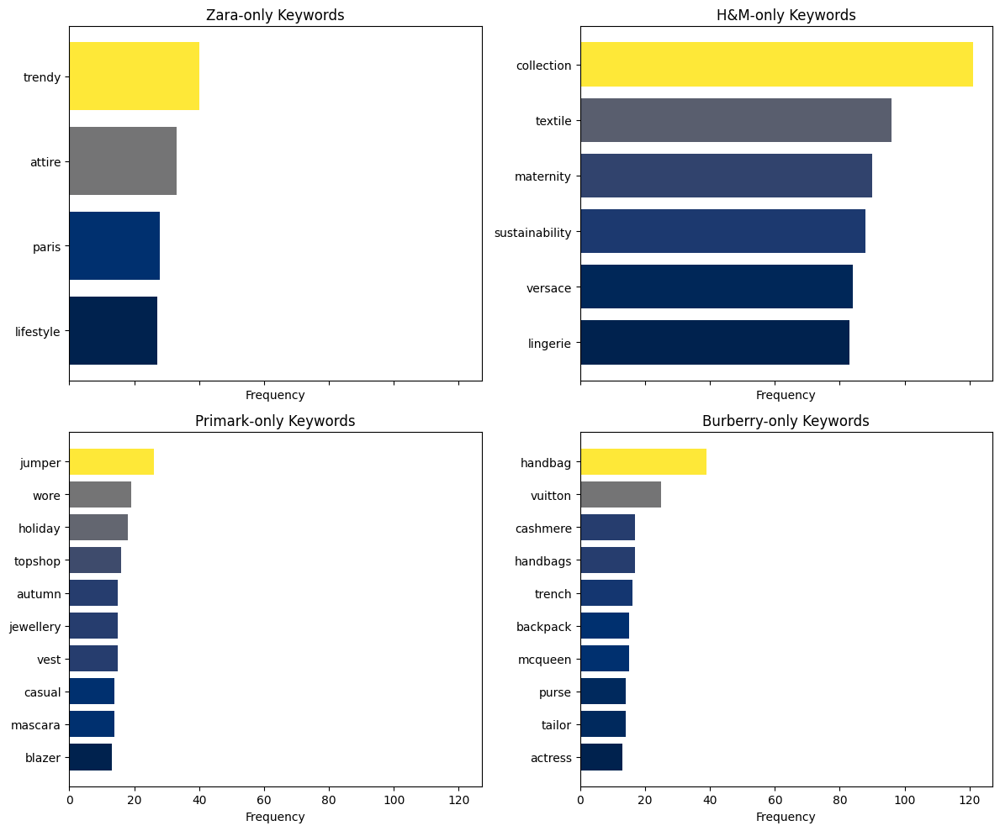

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/burberry_neu_pos_high_sent_unique_keywords.png


In [ ]:
# Output path for saving
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated")
output_path.mkdir(parents=True, exist_ok=True)

# Brand settings
brands = ['zara', 'h&m', 'primark', 'burberry']
display = {'zara': 'Zara', 'h&m': 'H&M', 'primark': 'Primark', 'burberry': 'Burberry'}
M = 10
cmap = plt.colormaps['cividis']  # For matplotlib >=3.7

# Create square layout (2x2)
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=True)
axes = axes.flatten()

# Plot for each brand
for ax, brand in zip(axes, brands):
    display_name = display[brand]

    uniq = unique_keywords[unique_keywords[display_name] > 0].nlargest(M, display_name)
    values = uniq[display_name].values

    norm = Normalize(vmin=values.min(), vmax=values.max())
    colors = cmap(norm(values))

    ax.barh(uniq['keyword'], values, color=colors)
    ax.invert_yaxis()
    ax.set_title(f"{display_name}-only Keywords")
    ax.set_xlabel("Frequency")

plt.tight_layout()

# Save the full 2x2 grid as one image
out_file = output_path / f"{display[brand].lower().replace(' ','_')}_neu_pos_high_sent_unique_keywords.png"
fig.savefig(out_file, dpi=300, bbox_inches='tight')

# Show inline
plt.show()
plt.close(fig)

print(f"Saved {out_file}")

## Heatmap of Common Top Keywords

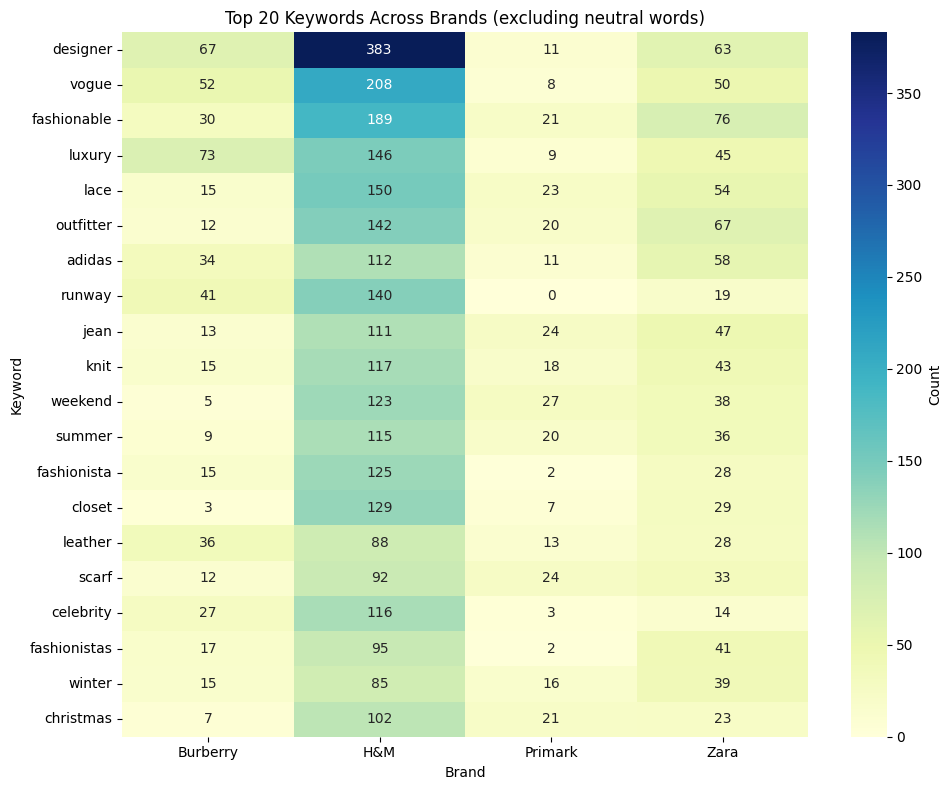

In [ ]:
# Build long-form DataFrame
rows = []
for key, kws in brand_keywords.items():
    label = display_names.get(key, key)
    for kw, cnt in Counter(kws).items():
        if kw not in neutral_words:
            rows.append((label, kw, cnt))
df = pd.DataFrame(rows, columns=['brand', 'keyword', 'count'])

# Pivot to matrix
pivot = df.pivot_table(
    index='keyword',
    columns='brand',
    values='count',
    fill_value=0
)

# Keep only top 20 keywords
top20 = pivot.sum(axis=1).nlargest(20).index
pivot = pivot.loc[top20]

# Plot heatmap with a smooth sequential palette
plt.figure(figsize=(10, 8))
sns.heatmap(
    pivot,
    annot=True,
    fmt=".0f",         # integer‐style formatting
    cmap="YlGnBu",     # smooth yellow→green→blue
    cbar_kws={'label': 'Count'}
)
plt.title("Top 20 Keywords Across Brands (excluding neutral words)")
plt.ylabel("Keyword")
plt.xlabel("Brand")
plt.tight_layout()
plt.show()

## Uni-bigram

### Overall top keyword - Bar chart

In [ ]:
# Load the data
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/neu_and_pos_high_sent-nlp-added-features-bi.csv")
df = pd.read_csv(output_path)

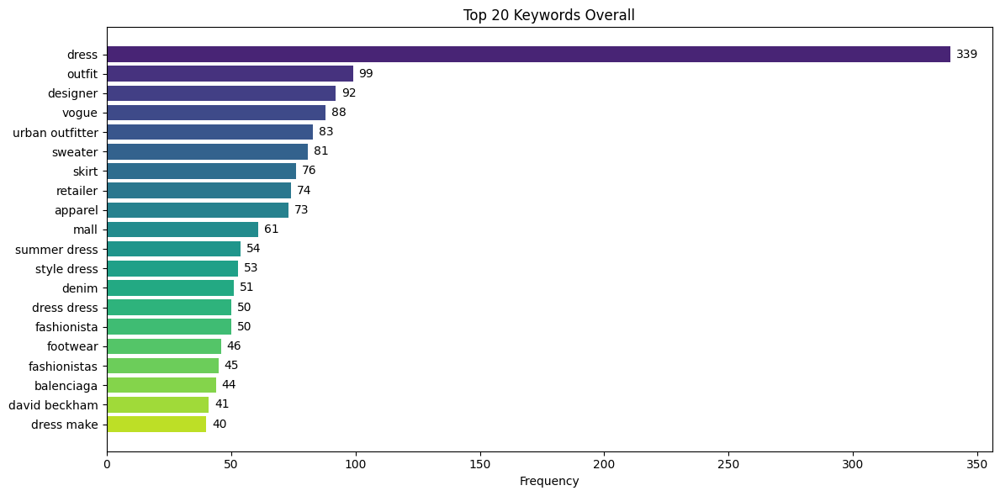

In [ ]:
all_keywords = [kw for kws in df['kw_uni_bi'] for kw in eval(kws)]
keyword_counts = Counter(all_keywords)
top_keywords = keyword_counts.most_common(20)
labels, values = zip(*top_keywords)

cmap = plt.get_cmap('viridis')                      # or 'plasma', 'cividis', etc.
colors = cmap(np.linspace(0.1, 0.9, len(labels)))   # avoid extremes of the colormap

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(labels[::-1], values[::-1], color=colors[::-1])

ax.bar_label(bars, labels=[f"{v}" for v in values[::-1]], padding=5, fontsize=10)

ax.set_title("Top 20 Keywords Overall")
ax.set_xlabel("Frequency")
plt.tight_layout()
plt.show()

###  Overall top keyword - Bar chart (Filtering out of neutral keyword of fashion product)

We fixed the same neutral_keyword since unigram analysis

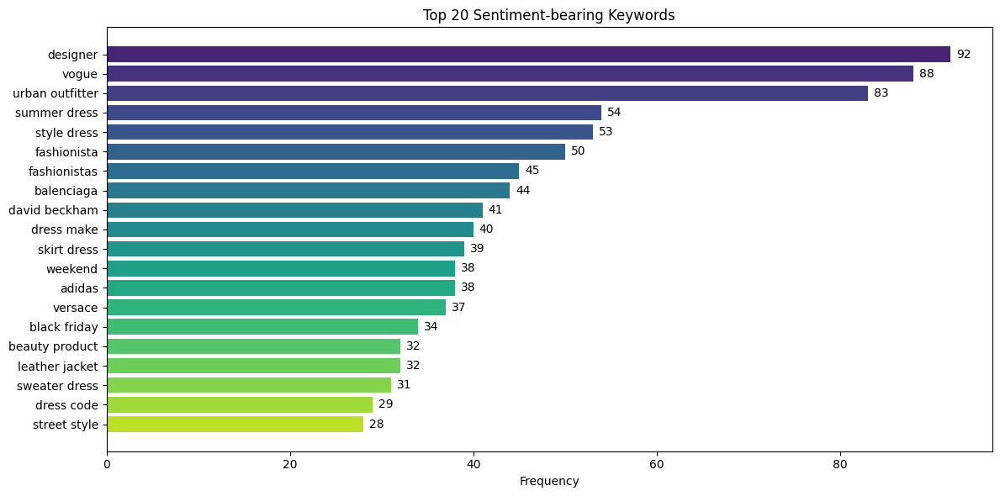

In [ ]:
all_keywords = [
    kw
    for kws in df['kw_uni_bi']
    for kw in eval(kws)
    if kw not in neutral_words
]

keyword_counts = Counter(all_keywords)
top_keywords = keyword_counts.most_common(20)
labels, values = zip(*top_keywords)

cmap = plt.get_cmap('viridis')
colors = cmap(np.linspace(0.1, 0.9, len(labels)))

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(labels[::-1], values[::-1], color=colors[::-1])
ax.bar_label(bars, labels=[f"{v}" for v in values[::-1]], padding=5, fontsize=10)

ax.set_title("Top 20 Sentiment‐bearing Keywords")
ax.set_xlabel("Frequency")
plt.tight_layout()
plt.show()


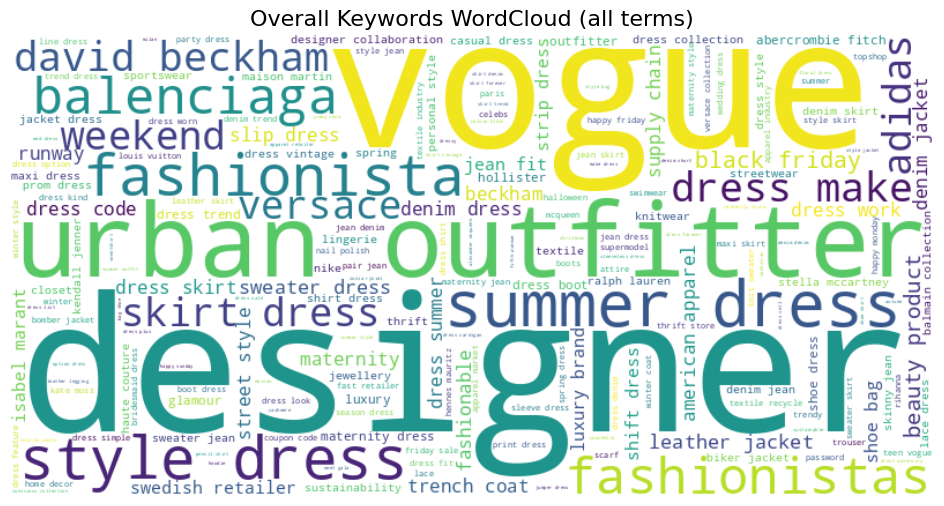

In [ ]:
# Flatten all keywords (excluding neutrals) into one big list
all_keywords = [
    kw
    for kws in df['kw_uni_bi']
    for kw in eval(kws)
    if kw not in neutral_words
]

# Count frequencies of every keyword
keyword_counts = Counter(all_keywords)

# Generate the WordCloud from the full frequency dict
wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='viridis',      # or any other cmap you prefer
    prefer_horizontal=0.9
).generate_from_frequencies(keyword_counts)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Overall Keywords WordCloud (all terms)", fontsize=16)
plt.show()

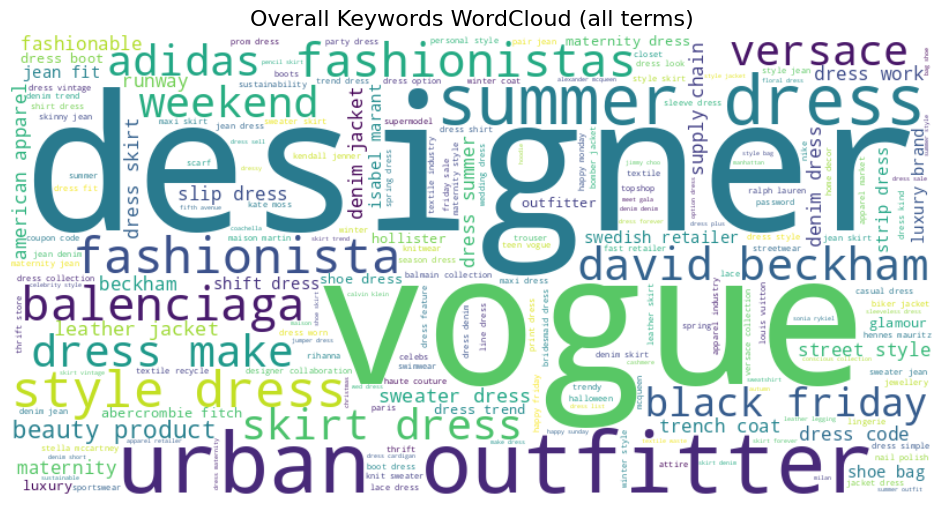

In [ ]:
# Flatten all keywords (excluding neutrals) into one big list
all_keywords = [
    kw
    for kws in df['kw_uni_bi']
    for kw in eval(kws)
    if kw not in neutral_words
]

# Count frequencies of every keyword
keyword_counts = Counter(all_keywords)

# Generate the WordCloud from the full frequency dict
wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='viridis',      # or any other cmap you prefer
    prefer_horizontal=0.9
).generate_from_frequencies(keyword_counts)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Overall Keywords WordCloud (all terms)", fontsize=16)
plt.show()

## Bar Chart across brands

In [ ]:
brand_keywords = df.groupby('brand_name')['kw_uni_bi'].apply(
    lambda x: [kw for sublist in x for kw in eval(sublist) if kw not in neutral_words]
)

top_brand_keywords = brand_keywords.apply(lambda x: Counter(x).most_common(20))

In [ ]:
df["brand_name"] = df["brand_name"].str.lower().str.strip()

In [ ]:
top_brand_keywords.index = top_brand_keywords.index.str.lower().str.strip()

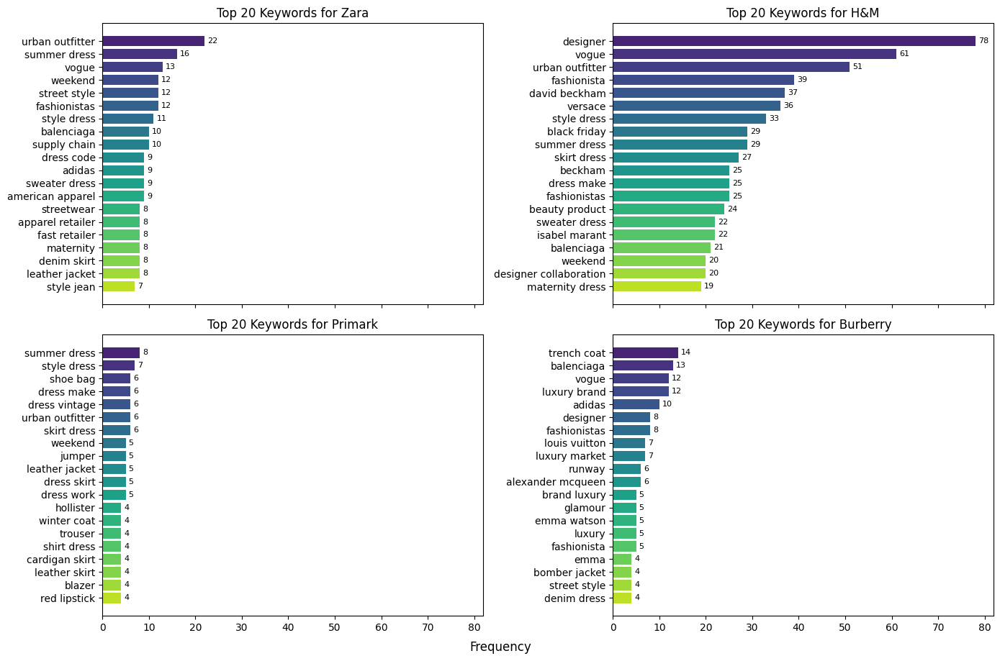

In [ ]:
# Rebuild brand_keywords with neutral words excluded:
brand_keywords = (
    df
    .groupby('brand_name')['kw_uni_bi']
    .apply(lambda series: [
        kw
        for kws in series
        for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# Compute top-20 per brand
top_brand_keywords = brand_keywords.apply(lambda kw_list: Counter(kw_list).most_common(20))

brands = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}

fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
axes = axes.flatten()
cmap = plt.get_cmap('viridis')

for ax, brand in zip(axes, brands):
    top20 = top_brand_keywords[brand]      # now already filtered
    labels, values = zip(*top20)

    colors = cmap(np.linspace(0.1, 0.9, len(labels)))
    bars = ax.barh(labels, values, color=colors)
    ax.bar_label(bars, labels=[str(v) for v in values], padding=3, fontsize=8)

    ax.set_title(f"Top 20 Keywords for {display_names[brand]}")
    ax.invert_yaxis()

fig.text(0.5, 0.04, 'Frequency', ha='center', fontsize=12)
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

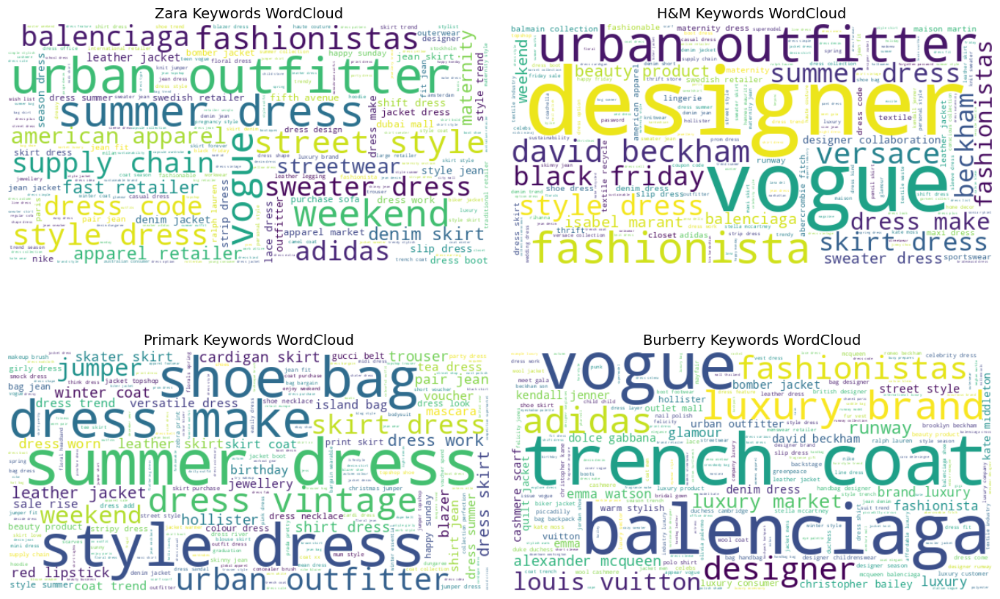

In [ ]:
brands  = ['zara', 'h&m', 'primark', 'burberry']
display = {'zara':'Zara','h&m':'H&M','primark':'Primark','burberry':'Burberry'}

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for ax, brand in zip(axes, brands):
    # Gather this brand’s keywords (excluding neutrals)
    kws = (
        df.loc[df['brand_name']==brand, 'kw_uni_bi']
        .apply(eval)
        .explode()
        .tolist()
    )
    kws = [kw for kw in kws if kw not in neutral_words]

    # Count every keyword for this brand
    freq = Counter(kws)

    # Build wordcloud from full dict
    wc = WordCloud(
        width=600,
        height=300,
        background_color='white',
        colormap='viridis',
        prefer_horizontal=0.9
    ).generate_from_frequencies(freq)

    #  Plot on its axis
    ax.imshow(wc, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(f"{display[brand]} Keywords WordCloud", fontsize=14)

plt.tight_layout(pad=2)
plt.show()

### Word Cloud Visuals

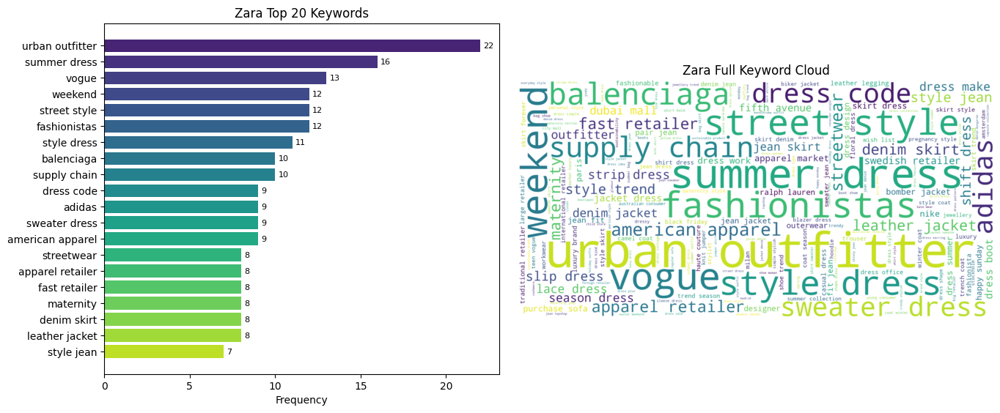

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/zara_neu_pos_high_sent_keywords_uni_bi.png


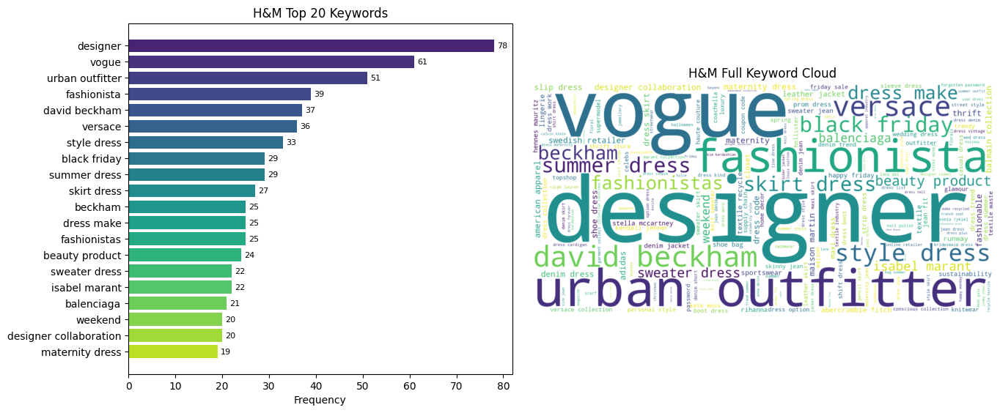

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/h&m_neu_pos_high_sent_keywords_uni_bi.png


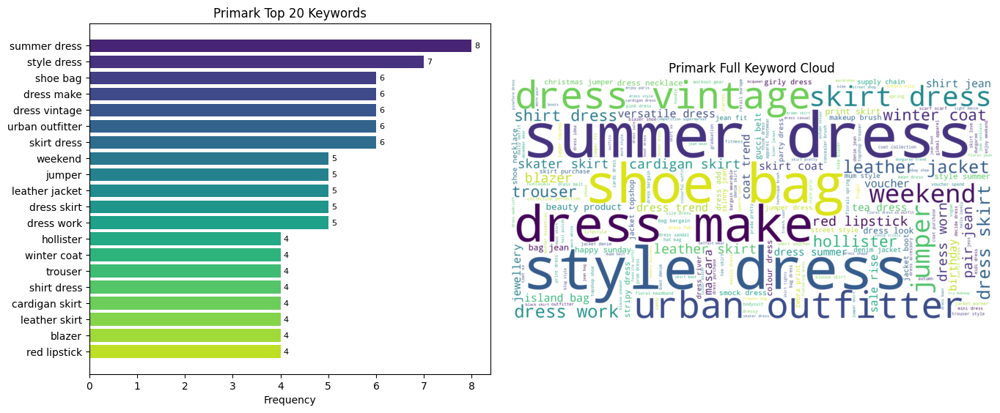

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/primark_neu_pos_high_sent_keywords_uni_bi.png


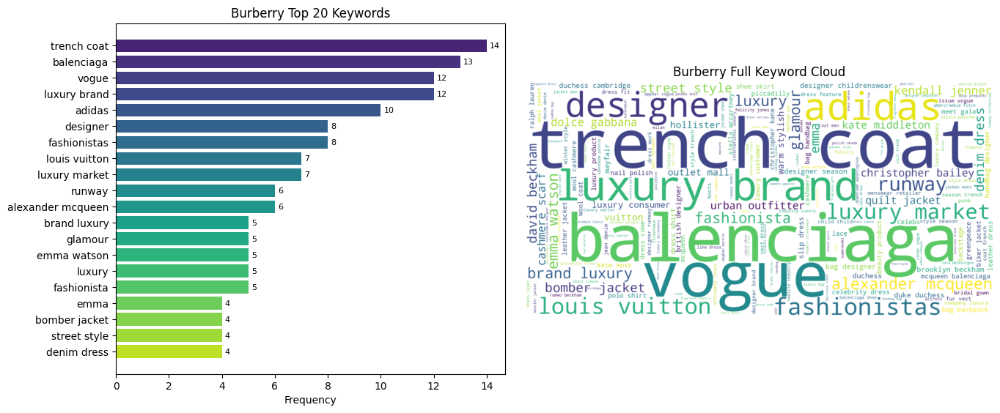

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/burberry_neu_pos_high_sent_keywords_uni_bi.png


In [ ]:
from IPython.display import display
brands      = ['zara', 'h&m', 'primark', 'burberry']
display     = {'zara':'Zara','h&m':'H&M','primark':'Primark','burberry':'Burberry'}
neutral     = set(neutral_words)   # your neutral‐word list
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated")
output_path.mkdir(parents=True, exist_ok=True)

for brand in brands:
    # 1) gather & filter keywords
    kws = (
        df.loc[df['brand_name']==brand, 'kw_uni_bi']
          .apply(eval)
          .explode()
          .tolist()
    )
    kws = [kw for kw in kws if kw not in neutral]
    freq = Counter(kws)

    # 2) top-20 for bars
    top20 = freq.most_common(20)
    labels, values = zip(*top20)

    # 3) new figure with 1×2 layout
    fig, (ax_bar, ax_wc) = plt.subplots(1, 2, figsize=(14, 6),
                                        gridspec_kw={'width_ratios': [1,1.2]})

    # — Left: horizontal bar chart
    cmap = plt.get_cmap('viridis')
    colors = cmap(np.linspace(0.1, 0.9, len(values)))
    bars = ax_bar.barh(labels[::-1], values[::-1], color=colors[::-1])
    ax_bar.bar_label(bars, padding=3, fontsize=8)
    ax_bar.set_title(f"{display[brand]} Top 20 Keywords")
    ax_bar.set_xlabel("Frequency")

    # — Right: “spread‐out” wordcloud
    wc = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='viridis',
        max_words=200,
        scale=3,
        prefer_horizontal=0.5
    ).generate_from_frequencies(freq)

    ax_wc.imshow(wc, interpolation='bilinear')
    ax_wc.axis('off')
    ax_wc.set_title(f"{display[brand]} Full Keyword Cloud")

    plt.tight_layout(pad=2.0)

    # **Display inline**
    plt.show()

    # 4) save to PNG
    out_file = output_path / f"{display[brand].lower().replace(' ','_')}_neu_pos_high_sent_keywords_uni_bi.png"
    fig.savefig(out_file, dpi=300, bbox_inches='tight')
    plt.close(fig)

    print(f"Saved {out_file}")


### Top 30 keywords as table

In [ ]:
from IPython.display import display
# Rebuild brand_keywords with neutral words excluded
brand_keywords = (
    df
    .groupby('brand_name')['kw_uni_bi']
    .apply(lambda series: [
        kw for kws in series for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# 2) Decide which brands to show and how many keywords
brands        = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}
top_n = 50

# 3) Build a dict of DataFrames, keyed by the original brand string
df_top_keywords = {}

for brand in brands:
    counts    = Counter(brand_keywords[brand]).most_common(top_n)
    df_brand  = pd.DataFrame(counts, columns=['Keyword', 'Count'])
    df_top_keywords[brand] = df_brand

# 4) (Optional) unpack into four variables if you need them by name
df_top_zara      = df_top_keywords['zara']
df_top_hm        = df_top_keywords['h&m']
df_top_primark  = df_top_keywords['primark']
df_top_burberry = df_top_keywords['burberry']

# 5) Display them all
for brand, tbl in df_top_keywords.items():
    print(f"\nTop {top_n} Keywords for {display_names[brand]}")
    display(tbl)



Top 50 Keywords for Zara


,Keyword,Count
0,urban outfitter,22
1,summer dress,16
2,vogue,13
3,weekend,12
4,street style,12
5,fashionistas,12
6,style dress,11
7,balenciaga,10
8,supply chain,10
9,dress code,9



Top 50 Keywords for H&M


,Keyword,Count
0,designer,78
1,vogue,61
2,urban outfitter,51
3,fashionista,39
4,david beckham,37
5,versace,36
6,style dress,33
7,black friday,29
8,summer dress,29
9,skirt dress,27



Top 50 Keywords for Primark


,Keyword,Count
0,summer dress,8
1,style dress,7
2,shoe bag,6
3,dress make,6
4,dress vintage,6
5,urban outfitter,6
6,skirt dress,6
7,weekend,5
8,jumper,5
9,leather jacket,5



Top 50 Keywords for Burberry


,Keyword,Count
0,trench coat,14
1,balenciaga,13
2,vogue,12
3,luxury brand,12
4,adidas,10
5,designer,8
6,fashionistas,8
7,louis vuitton,7
8,luxury market,7
9,runway,6


In [ ]:
# Rebuild brand_keywords with neutral words excluded
brand_keywords = (
    df
    .groupby('brand_name')['kw_uni_bi']
    .apply(lambda series: [
        kw
        for kws in series
        for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# Specify brands and their display names
brands = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}
top_n = 30

# Build a DataFrame of the top-n keywords for each brand
df_top_keywords = {}
for b in brands:
    counts = Counter(brand_keywords[b]).most_common(top_n)
    df_b   = pd.DataFrame(counts, columns=['keyword', 'count'])
    df_b['brand'] = display_names[b]
    df_top_keywords[b] = df_b

# Combine all brand DataFrames into one
df_all = pd.concat(df_top_keywords.values(), ignore_index=True)

# Pivot so each brand becomes its own column of counts
pivot_df = (
    df_all
    .pivot_table(
        index='keyword',
        columns='brand',
        values='count',
        fill_value=0
    )
    .reset_index()
)

# Select keywords present in all four brands
mask_all = (pivot_df[display_names[b]] > 0 for b in brands)
common_keywords = pivot_df.loc[
    pd.concat(mask_all, axis=1).all(axis=1)
].sort_values(by=[display_names[b] for b in brands], ascending=False)

# Select keywords present in exactly one brand
mask_any = (pivot_df[display_names[b]] > 0 for b in brands)
unique_keywords = pivot_df.loc[
    pd.concat(mask_any, axis=1).sum(axis=1) == 1
].sort_values(by=[display_names[b] for b in brands], ascending=False)

In [ ]:
# Render the two tables side-by-side for reporting
html = f"""
<div style="display:flex; gap:40px;">
  <div style="flex:1;">
    <h3>Common Keywords (All 4 Brands)</h3>
    {common_keywords.to_html(index=False)}
  </div>
  <div style="flex:1;">
    <h3>Unique Keywords (Exactly One Brand)</h3>
    {unique_keywords.to_html(index=False)}
  </div>
</div>
"""
display(HTML(html))

brand,keyword,Burberry,H&M,Primark,Zara
,urban outfitter,4.0,51.0,6.0,22.0
brand,keyword,Burberry,H&M,Primark,Zara
,supply chain,0.0,0.0,0.0,10.0
,apparel retailer,0.0,0.0,0.0,8.0
,denim skirt,0.0,0.0,0.0,8.0
,fast retailer,0.0,0.0,0.0,8.0
,maternity,0.0,0.0,0.0,8.0
,streetwear,0.0,0.0,0.0,8.0
,denim jacket,0.0,0.0,0.0,7.0
,lace dress,0.0,0.0,0.0,7.0


### Bar chart of common keyword (%)

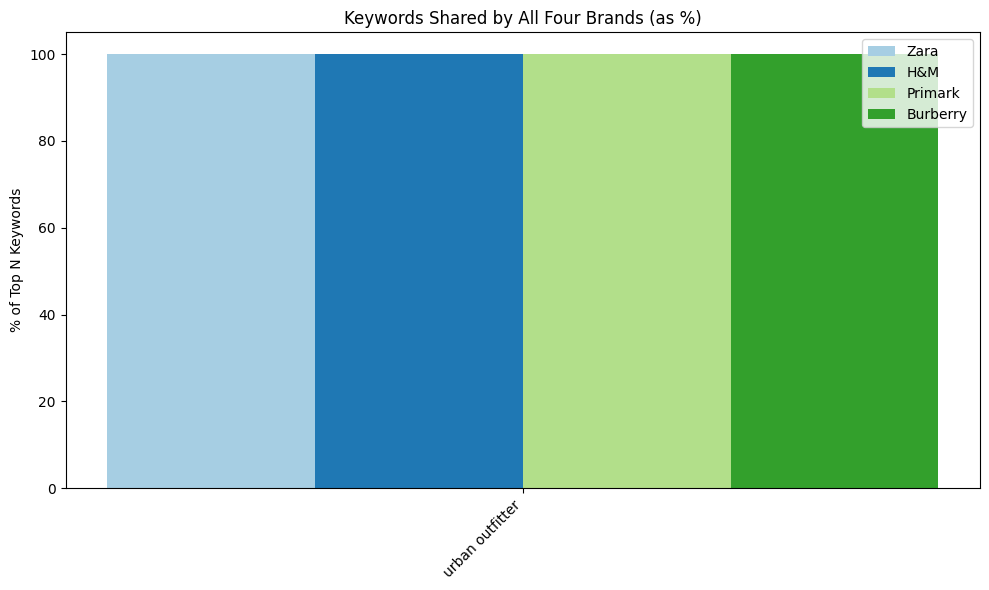

In [ ]:
# Pick up to K common keywords
K = 10
top_common = common_keywords.head(K).set_index('keyword')

# Brands & display names
brands = list(display_names.values())

# Build a (K × 4) matrix of percentages
pct_data = np.vstack([
    (top_common[brand] / top_common[brand].sum() * 100).values
    for brand in brands
]).T  # shape = (K, 4)

actual_K = pct_data.shape[0]

fig, ax = plt.subplots(figsize=(10, 6))

x     = np.arange(actual_K)
width = 0.8 / len(brands)

# use the Paired colormap (which has 12 distinct, formal-yet-vibrant colors)
cmap = plt.get_cmap('Paired')
colors = cmap.colors[:len(brands)]  # take as many as you need (4 here)

for i, (brand, color) in enumerate(zip(brands, colors)):
    ax.bar(x + i*width, pct_data[:, i], width, label=brand, color=color)

ax.set_xticks(x + width*(len(brands)-1)/2)
ax.set_xticklabels(top_common.index, rotation=45, ha='right')
ax.set_ylabel("% of Top N Keywords")
ax.set_title("Keywords Shared by All Four Brands (as %)")
ax.legend()

plt.tight_layout()
plt.show()

### Bar chart of unique keywords across brands

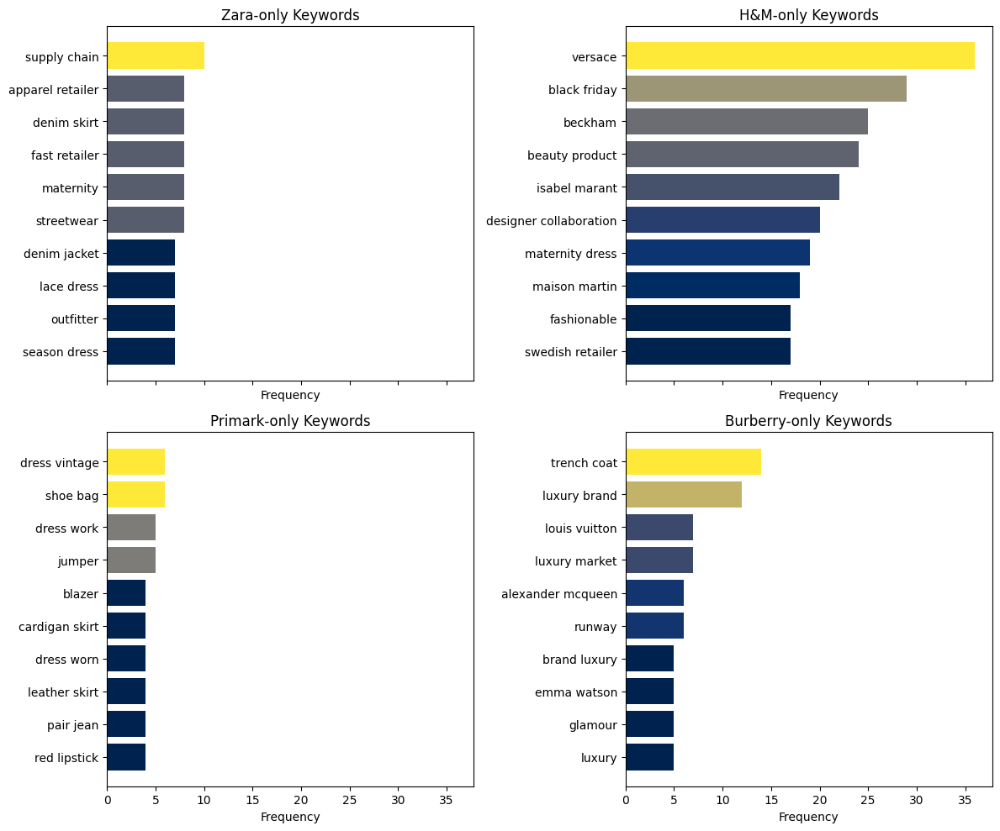

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/burberry_neu_pos_high_sent_unique_keywords_uni_bi.png


In [ ]:
# Output path for saving
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated")
output_path.mkdir(parents=True, exist_ok=True)

# Brand settings
brands = ['zara', 'h&m', 'primark', 'burberry']
display = {'zara': 'Zara', 'h&m': 'H&M', 'primark': 'Primark', 'burberry': 'Burberry'}
M = 10
cmap = plt.colormaps['cividis']  # For matplotlib >=3.7

# Create square layout (2x2)
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=True)
axes = axes.flatten()

# Plot for each brand
for ax, brand in zip(axes, brands):
    display_name = display[brand]

    uniq = unique_keywords[unique_keywords[display_name] > 0].nlargest(M, display_name)
    values = uniq[display_name].values

    norm = Normalize(vmin=values.min(), vmax=values.max())
    colors = cmap(norm(values))

    ax.barh(uniq['keyword'], values, color=colors)
    ax.invert_yaxis()
    ax.set_title(f"{display_name}-only Keywords")
    ax.set_xlabel("Frequency")

plt.tight_layout()

# Save the full 2x2 grid as one image
out_file = output_path / f"{display[brand].lower().replace(' ','_')}_neu_pos_high_sent_unique_keywords_uni_bi.png"
fig.savefig(out_file, dpi=300, bbox_inches='tight')

# Show inline
plt.show()
plt.close(fig)

print(f"Saved {out_file}")


## Heatmap of Common Top Keywords

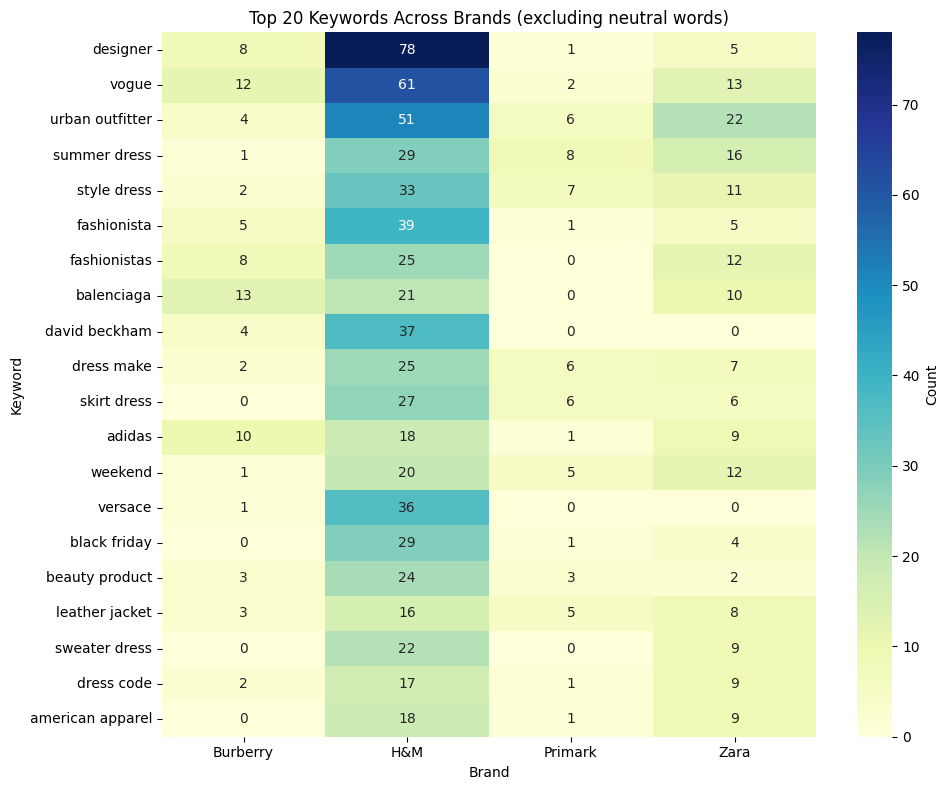

In [ ]:
# Build long-form DataFrame
rows = []
for key, kws in brand_keywords.items():
    label = display_names.get(key, key)
    for kw, cnt in Counter(kws).items():
        if kw not in neutral_words:
            rows.append((label, kw, cnt))
df = pd.DataFrame(rows, columns=['brand', 'keyword', 'count'])

# Pivot to matrix
pivot = df.pivot_table(
    index='keyword',
    columns='brand',
    values='count',
    fill_value=0
)

# Keep only top 20 keywords
top20 = pivot.sum(axis=1).nlargest(20).index
pivot = pivot.loc[top20]

# Plot heatmap with a smooth sequential palette
plt.figure(figsize=(10, 8))
sns.heatmap(
    pivot,
    annot=True,
    fmt=".0f",         # integer‐style formatting
    cmap="YlGnBu",     # smooth yellow→green→blue
    cbar_kws={'label': 'Count'}
)
plt.title("Top 20 Keywords Across Brands (excluding neutral words)")
plt.ylabel("Keyword")
plt.xlabel("Brand")
plt.tight_layout()
plt.show()

## Bigram

### Overall top keyword - Bar chart

In [ ]:
# Load the data
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/neu_and_pos_high_sent-nlp-added-features-bi.csv")
df = pd.read_csv(output_path)

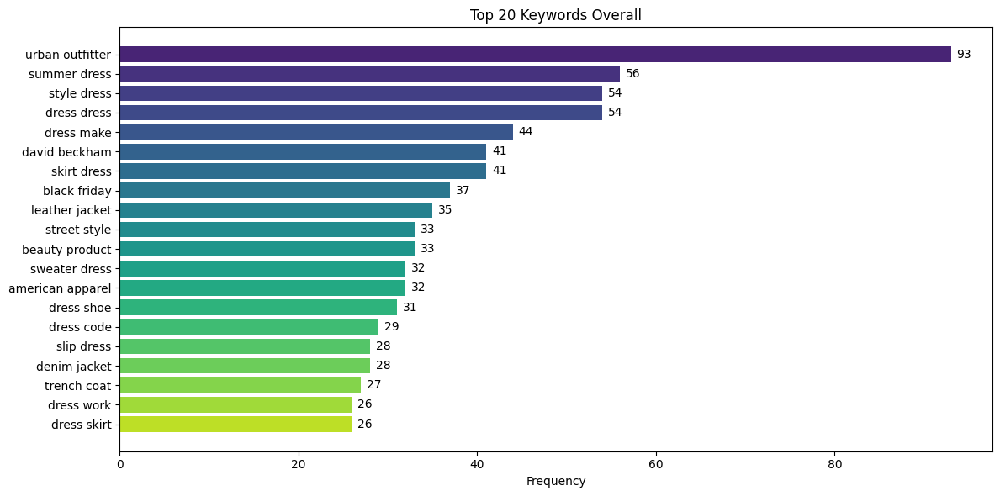

In [ ]:
all_keywords = [kw for kws in df['kw_bigram'] for kw in eval(kws)]
keyword_counts = Counter(all_keywords)
top_keywords = keyword_counts.most_common(20)
labels, values = zip(*top_keywords)

cmap = plt.get_cmap('viridis')                      # or 'plasma', 'cividis', etc.
colors = cmap(np.linspace(0.1, 0.9, len(labels)))   # avoid extremes of the colormap

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(labels[::-1], values[::-1], color=colors[::-1])

ax.bar_label(bars, labels=[f"{v}" for v in values[::-1]], padding=5, fontsize=10)

ax.set_title("Top 20 Keywords Overall")
ax.set_xlabel("Frequency")
plt.tight_layout()
plt.show()

###  Overall top keyword - Bar chart (Filtering out of neutral keyword of fashion product)

We fixed the same neutral_keyword since unigram analysis

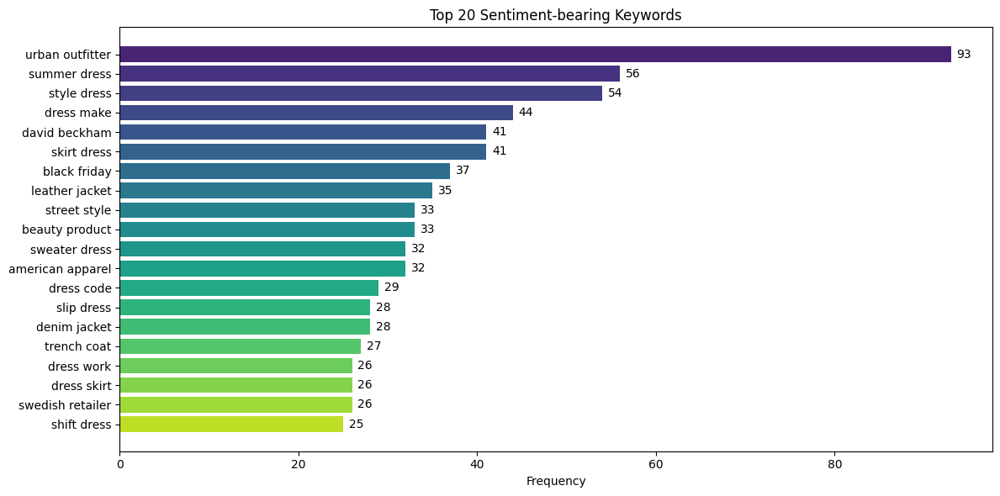

In [ ]:
all_keywords = [
    kw
    for kws in df['kw_bigram']
    for kw in eval(kws)
    if kw not in neutral_words
]

keyword_counts = Counter(all_keywords)
top_keywords = keyword_counts.most_common(20)
labels, values = zip(*top_keywords)

cmap = plt.get_cmap('viridis')
colors = cmap(np.linspace(0.1, 0.9, len(labels)))

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(labels[::-1], values[::-1], color=colors[::-1])
ax.bar_label(bars, labels=[f"{v}" for v in values[::-1]], padding=5, fontsize=10)

ax.set_title("Top 20 Sentiment‐bearing Keywords")
ax.set_xlabel("Frequency")
plt.tight_layout()
plt.show()


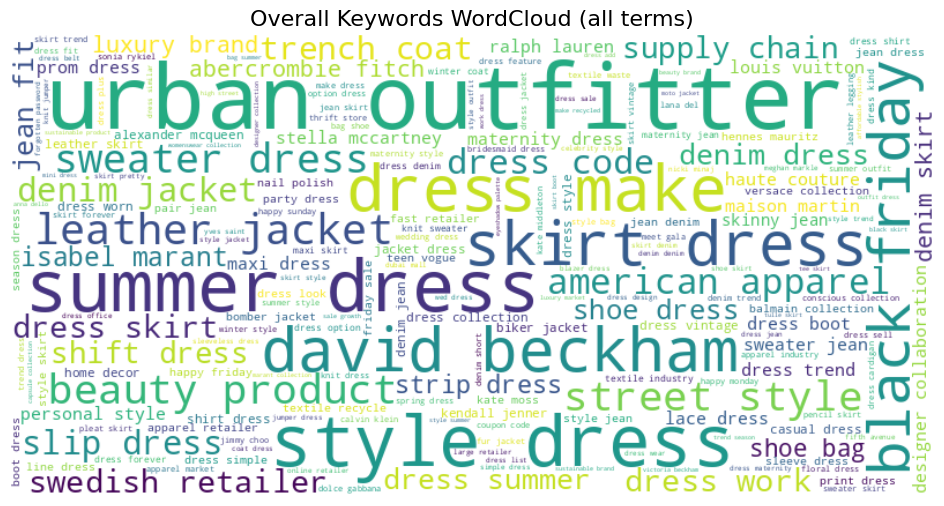

In [ ]:
# Flatten all keywords (excluding neutrals) into one big list
all_keywords = [
    kw
    for kws in df['kw_bigram']
    for kw in eval(kws)
    if kw not in neutral_words
]

# Count frequencies of every keyword
keyword_counts = Counter(all_keywords)

# Generate the WordCloud from the full frequency dict
wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='viridis',      # or any other cmap you prefer
    prefer_horizontal=0.9
).generate_from_frequencies(keyword_counts)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Overall Keywords WordCloud (all terms)", fontsize=16)
plt.show()

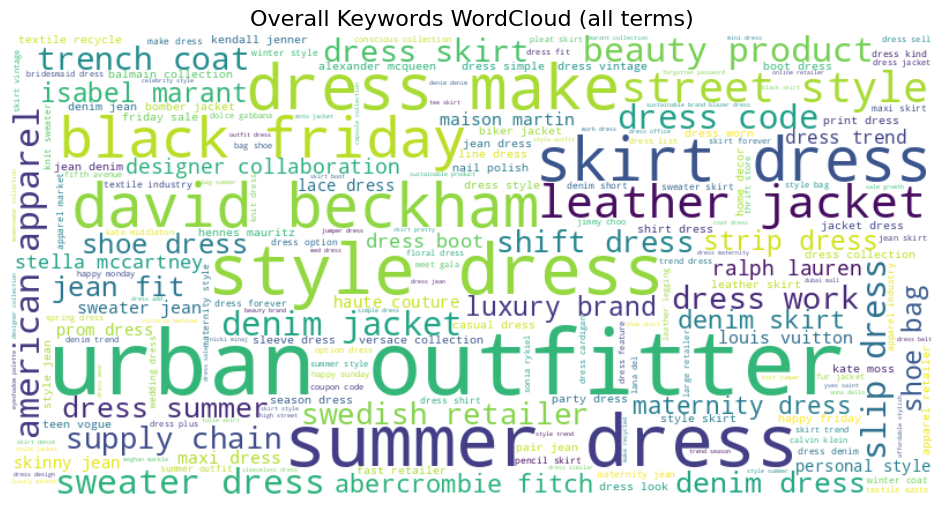

In [ ]:
# Flatten all keywords (excluding neutrals) into one big list
all_keywords = [
    kw
    for kws in df['kw_bigram']
    for kw in eval(kws)
    if kw not in neutral_words
]

# Count frequencies of every keyword
keyword_counts = Counter(all_keywords)

# Generate the WordCloud from the full frequency dict
wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='viridis',      # or any other cmap you prefer
    prefer_horizontal=0.9
).generate_from_frequencies(keyword_counts)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Overall Keywords WordCloud (all terms)", fontsize=16)
plt.show()

## Bar Chart across brands

In [ ]:
brand_keywords = df.groupby('brand_name')['kw_bigram'].apply(
    lambda x: [kw for sublist in x for kw in eval(sublist) if kw not in neutral_words]
)

top_brand_keywords = brand_keywords.apply(lambda x: Counter(x).most_common(20))

In [ ]:
df["brand_name"] = df["brand_name"].str.lower().str.strip()
top_brand_keywords.index = top_brand_keywords.index.str.lower().str.strip()

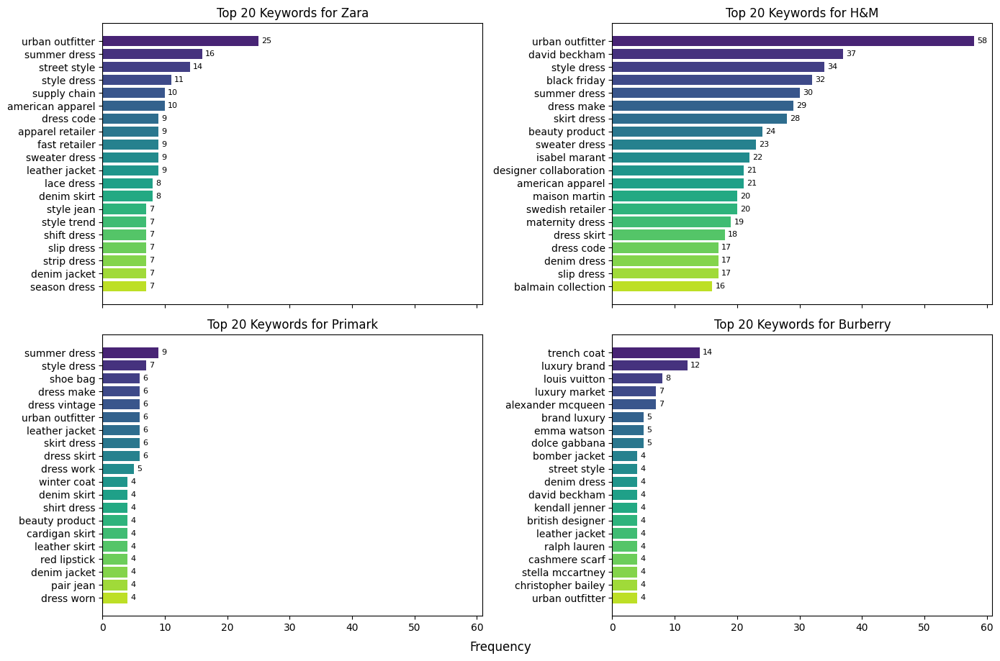

In [ ]:
# Rebuild brand_keywords with neutral words excluded:
brand_keywords = (
    df
    .groupby('brand_name')['kw_bigram']
    .apply(lambda series: [
        kw
        for kws in series
        for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# Compute top-20 per brand
top_brand_keywords = brand_keywords.apply(lambda kw_list: Counter(kw_list).most_common(20))

brands = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}

fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
axes = axes.flatten()
cmap = plt.get_cmap('viridis')

for ax, brand in zip(axes, brands):
    top20 = top_brand_keywords[brand]      # now already filtered
    labels, values = zip(*top20)

    colors = cmap(np.linspace(0.1, 0.9, len(labels)))
    bars = ax.barh(labels, values, color=colors)
    ax.bar_label(bars, labels=[str(v) for v in values], padding=3, fontsize=8)

    ax.set_title(f"Top 20 Keywords for {display_names[brand]}")
    ax.invert_yaxis()

fig.text(0.5, 0.04, 'Frequency', ha='center', fontsize=12)
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

### Word Cloud Visuals

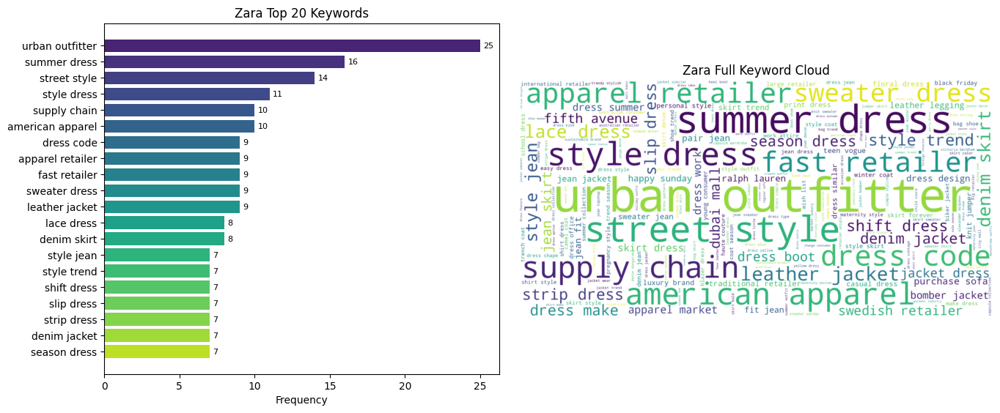

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/zara_neu_pos_high_sent_keywords_bi.png


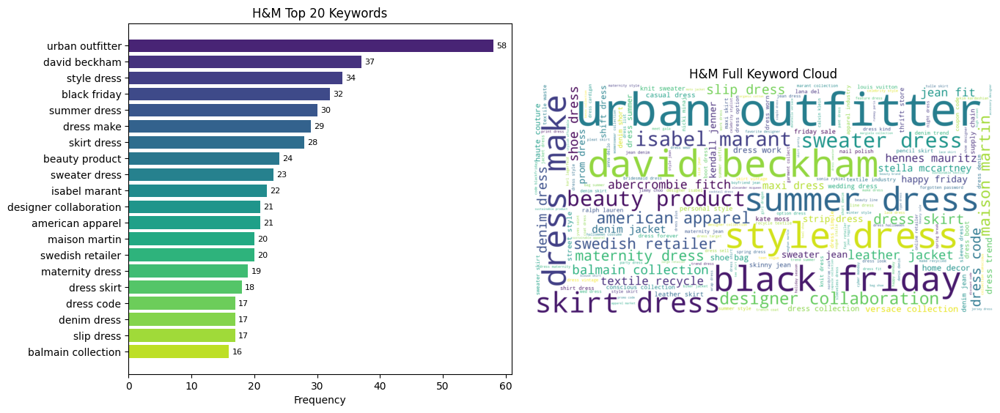

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/h&m_neu_pos_high_sent_keywords_bi.png


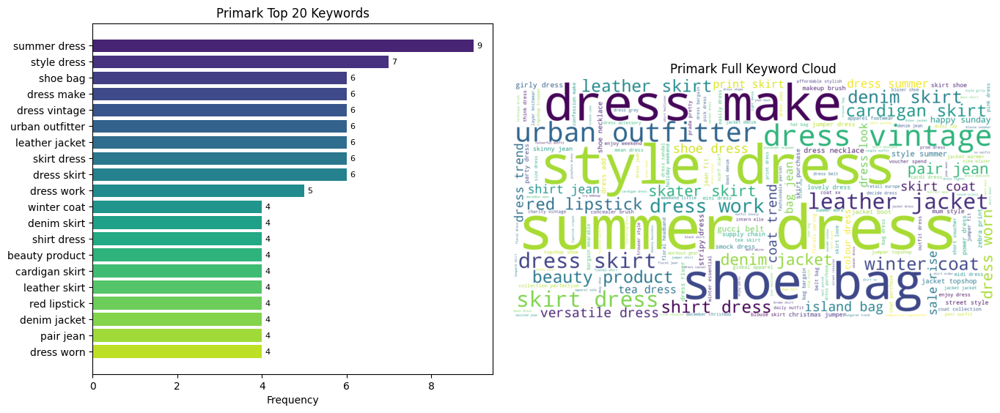

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/primark_neu_pos_high_sent_keywords_bi.png


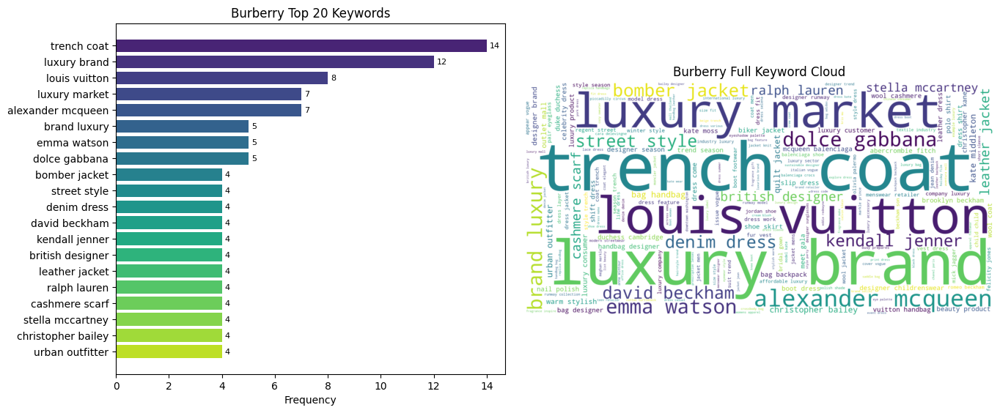

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/burberry_neu_pos_high_sent_keywords_bi.png


In [ ]:
brands      = ['zara', 'h&m', 'primark', 'burberry']
display     = {'zara':'Zara','h&m':'H&M','primark':'Primark','burberry':'Burberry'}
neutral     = set(neutral_words)   # your neutral‐word list
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated")
output_path.mkdir(parents=True, exist_ok=True)

for brand in brands:
    # 1) gather & filter keywords
    kws = (
        df.loc[df['brand_name']==brand, 'kw_bigram']
          .apply(eval)
          .explode()
          .tolist()
    )
    kws = [kw for kw in kws if kw not in neutral]
    freq = Counter(kws)

    # 2) top-20 for bars
    top20 = freq.most_common(20)
    labels, values = zip(*top20)

    # 3) new figure with 1×2 layout
    fig, (ax_bar, ax_wc) = plt.subplots(1, 2, figsize=(14, 6),
                                        gridspec_kw={'width_ratios': [1,1.2]})

    # — Left: horizontal bar chart
    cmap = plt.get_cmap('viridis')
    colors = cmap(np.linspace(0.1, 0.9, len(values)))
    bars = ax_bar.barh(labels[::-1], values[::-1], color=colors[::-1])
    ax_bar.bar_label(bars, padding=3, fontsize=8)
    ax_bar.set_title(f"{display[brand]} Top 20 Keywords")
    ax_bar.set_xlabel("Frequency")

    # — Right: “spread‐out” wordcloud
    wc = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='viridis',
        max_words=200,
        scale=3,
        prefer_horizontal=0.5
    ).generate_from_frequencies(freq)

    ax_wc.imshow(wc, interpolation='bilinear')
    ax_wc.axis('off')
    ax_wc.set_title(f"{display[brand]} Full Keyword Cloud")

    plt.tight_layout(pad=2.0)

    # **Display inline**
    plt.show()

    # 4) save to PNG
    out_file = output_path / f"{display[brand].lower().replace(' ','_')}_neu_pos_high_sent_keywords_bi.png"
    fig.savefig(out_file, dpi=300, bbox_inches='tight')
    plt.close(fig)

    print(f"Saved {out_file}")


### Top 30 keywords as table

In [ ]:
from IPython.display import display

In [ ]:
# Rebuild brand_keywords with neutral words excluded
brand_keywords = (
    df
    .groupby('brand_name')['kw_bigram']
    .apply(lambda series: [
        kw for kws in series for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# 2) Decide which brands to show and how many keywords
brands        = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}
top_n = 50

# 3) Build a dict of DataFrames, keyed by the original brand string
df_top_keywords = {}

for brand in brands:
    counts    = Counter(brand_keywords[brand]).most_common(top_n)
    df_brand  = pd.DataFrame(counts, columns=['Keyword', 'Count'])
    df_top_keywords[brand] = df_brand

# 4) (Optional) unpack into four variables if you need them by name
df_top_zara      = df_top_keywords['zara']
df_top_hm        = df_top_keywords['h&m']
df_top_primark  = df_top_keywords['primark']
df_top_burberry = df_top_keywords['burberry']

# 5) Display them all
for brand, tbl in df_top_keywords.items():
    print(f"\nTop {top_n} Keywords for {display_names[brand]}")
    display(tbl)



Top 50 Keywords for Zara


,Keyword,Count
0,urban outfitter,25
1,summer dress,16
2,street style,14
3,style dress,11
4,supply chain,10
5,american apparel,10
6,dress code,9
7,apparel retailer,9
8,fast retailer,9
9,sweater dress,9



Top 50 Keywords for H&M


,Keyword,Count
0,urban outfitter,58
1,david beckham,37
2,style dress,34
3,black friday,32
4,summer dress,30
5,dress make,29
6,skirt dress,28
7,beauty product,24
8,sweater dress,23
9,isabel marant,22



Top 50 Keywords for Primark


,Keyword,Count
0,summer dress,9
1,style dress,7
2,shoe bag,6
3,dress make,6
4,dress vintage,6
5,urban outfitter,6
6,leather jacket,6
7,skirt dress,6
8,dress skirt,6
9,dress work,5



Top 50 Keywords for Burberry


,Keyword,Count
0,trench coat,14
1,luxury brand,12
2,louis vuitton,8
3,luxury market,7
4,alexander mcqueen,7
5,brand luxury,5
6,emma watson,5
7,dolce gabbana,5
8,bomber jacket,4
9,street style,4


In [ ]:
# Rebuild brand_keywords with neutral words excluded
brand_keywords = (
    df
    .groupby('brand_name')['kw_bigram']
    .apply(lambda series: [
        kw
        for kws in series
        for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# Specify brands and their display names
brands = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}
top_n = 30

# Build a DataFrame of the top-n keywords for each brand
df_top_keywords = {}
for b in brands:
    counts = Counter(brand_keywords[b]).most_common(top_n)
    df_b   = pd.DataFrame(counts, columns=['keyword', 'count'])
    df_b['brand'] = display_names[b]
    df_top_keywords[b] = df_b

# Combine all brand DataFrames into one
df_all = pd.concat(df_top_keywords.values(), ignore_index=True)

# Pivot so each brand becomes its own column of counts
pivot_df = (
    df_all
    .pivot_table(
        index='keyword',
        columns='brand',
        values='count',
        fill_value=0
    )
    .reset_index()
)

# Select keywords present in all four brands
mask_all = (pivot_df[display_names[b]] > 0 for b in brands)
common_keywords = pivot_df.loc[
    pd.concat(mask_all, axis=1).all(axis=1)
].sort_values(by=[display_names[b] for b in brands], ascending=False)

# Select keywords present in exactly one brand
mask_any = (pivot_df[display_names[b]] > 0 for b in brands)
unique_keywords = pivot_df.loc[
    pd.concat(mask_any, axis=1).sum(axis=1) == 1
].sort_values(by=[display_names[b] for b in brands], ascending=False)

In [ ]:
# Render the two tables side-by-side for reporting
html = f"""
<div style="display:flex; gap:40px;">
  <div style="flex:1;">
    <h3>Common Keywords (All 4 Brands)</h3>
    {common_keywords.to_html(index=False)}
  </div>
  <div style="flex:1;">
    <h3>Unique Keywords (Exactly One Brand)</h3>
    {unique_keywords.to_html(index=False)}
  </div>
</div>
"""
display(HTML(html))

brand,keyword,Burberry,H&M,Primark,Zara
,urban outfitter,4.0,58.0,6.0,25.0
,leather jacket,4.0,16.0,6.0,9.0
brand,keyword,Burberry,H&M,Primark,Zara
,supply chain,0.0,0.0,0.0,10.0
,apparel retailer,0.0,0.0,0.0,9.0
,fast retailer,0.0,0.0,0.0,9.0
,lace dress,0.0,0.0,0.0,8.0
,season dress,0.0,0.0,0.0,7.0
,shift dress,0.0,0.0,0.0,7.0
,style jean,0.0,0.0,0.0,7.0


### Bar chart of common keyword (%)

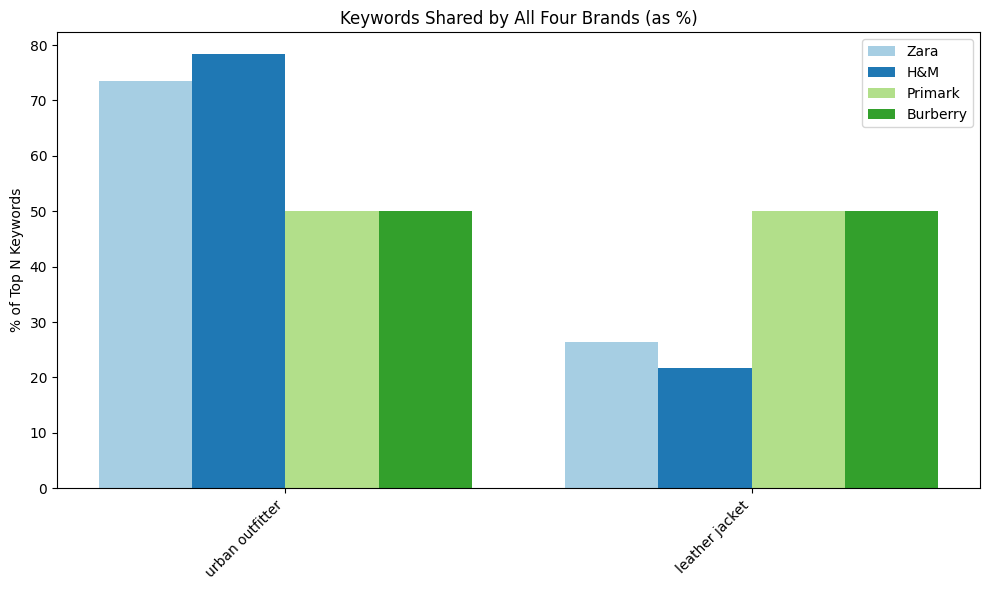

In [ ]:
# Pick up to K common keywords
K = 10
top_common = common_keywords.head(K).set_index('keyword')

# Brands & display names
brands = list(display_names.values())

# Build a (K × 4) matrix of percentages
pct_data = np.vstack([
    (top_common[brand] / top_common[brand].sum() * 100).values
    for brand in brands
]).T  # shape = (K, 4)

actual_K = pct_data.shape[0]

fig, ax = plt.subplots(figsize=(10, 6))

x     = np.arange(actual_K)
width = 0.8 / len(brands)

# use the Paired colormap (which has 12 distinct, formal-yet-vibrant colors)
cmap = plt.get_cmap('Paired')
colors = cmap.colors[:len(brands)]  # take as many as you need (4 here)

for i, (brand, color) in enumerate(zip(brands, colors)):
    ax.bar(x + i*width, pct_data[:, i], width, label=brand, color=color)

ax.set_xticks(x + width*(len(brands)-1)/2)
ax.set_xticklabels(top_common.index, rotation=45, ha='right')
ax.set_ylabel("% of Top N Keywords")
ax.set_title("Keywords Shared by All Four Brands (as %)")
ax.legend()

plt.tight_layout()
plt.show()


### Bar chart of unique keywords across brands

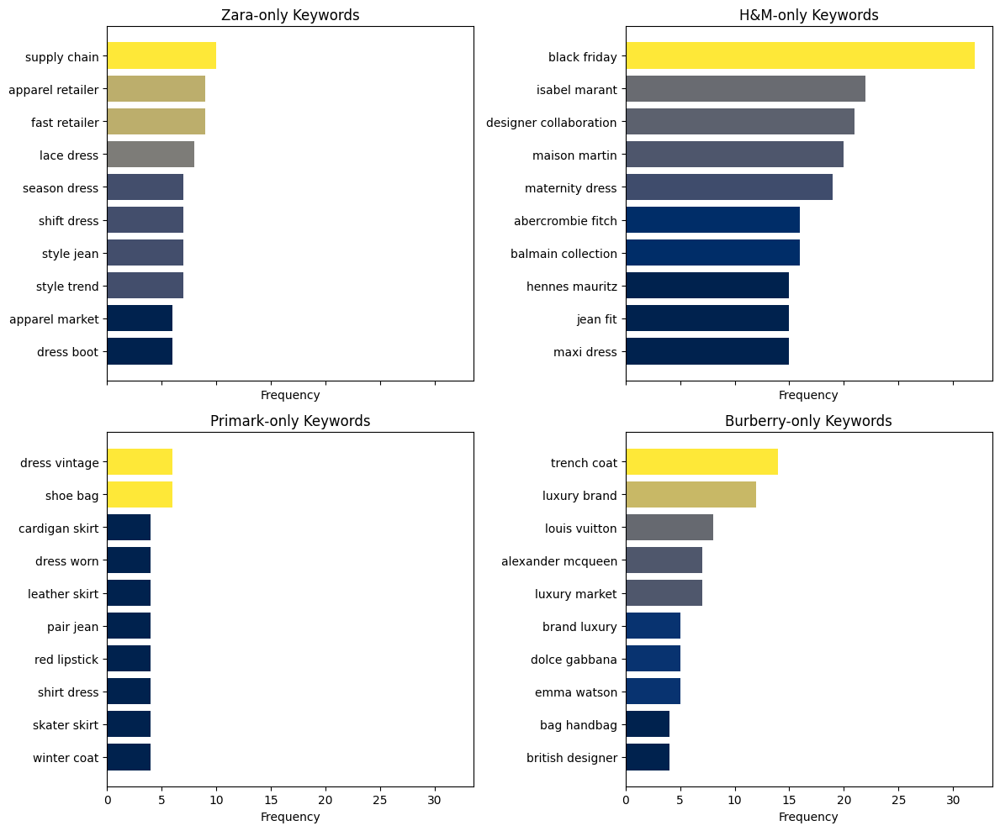

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated/burberry_neu_pos_high_sent_unique_keywords_bigram.png


In [ ]:
# Output path for saving
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_pos_and_neutral_updated")
output_path.mkdir(parents=True, exist_ok=True)

# Brand settings
brands = ['zara', 'h&m', 'primark', 'burberry']
display = {'zara': 'Zara', 'h&m': 'H&M', 'primark': 'Primark', 'burberry': 'Burberry'}
M = 10
cmap = plt.colormaps['cividis']  # For matplotlib >=3.7

# Create square layout (2x2)
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=True)
axes = axes.flatten()

# Plot for each brand
for ax, brand in zip(axes, brands):
    display_name = display[brand]

    uniq = unique_keywords[unique_keywords[display_name] > 0].nlargest(M, display_name)
    values = uniq[display_name].values

    norm = Normalize(vmin=values.min(), vmax=values.max())
    colors = cmap(norm(values))

    ax.barh(uniq['keyword'], values, color=colors)
    ax.invert_yaxis()
    ax.set_title(f"{display_name}-only Keywords")
    ax.set_xlabel("Frequency")

plt.tight_layout()

# Save the full 2x2 grid as one image
out_file = output_path / f"{display[brand].lower().replace(' ','_')}_neu_pos_high_sent_unique_keywords_bigram.png"
fig.savefig(out_file, dpi=300, bbox_inches='tight')

# Show inline
plt.show()
plt.close(fig)

print(f"Saved {out_file}")


## Heatmap of Common Top Keywords

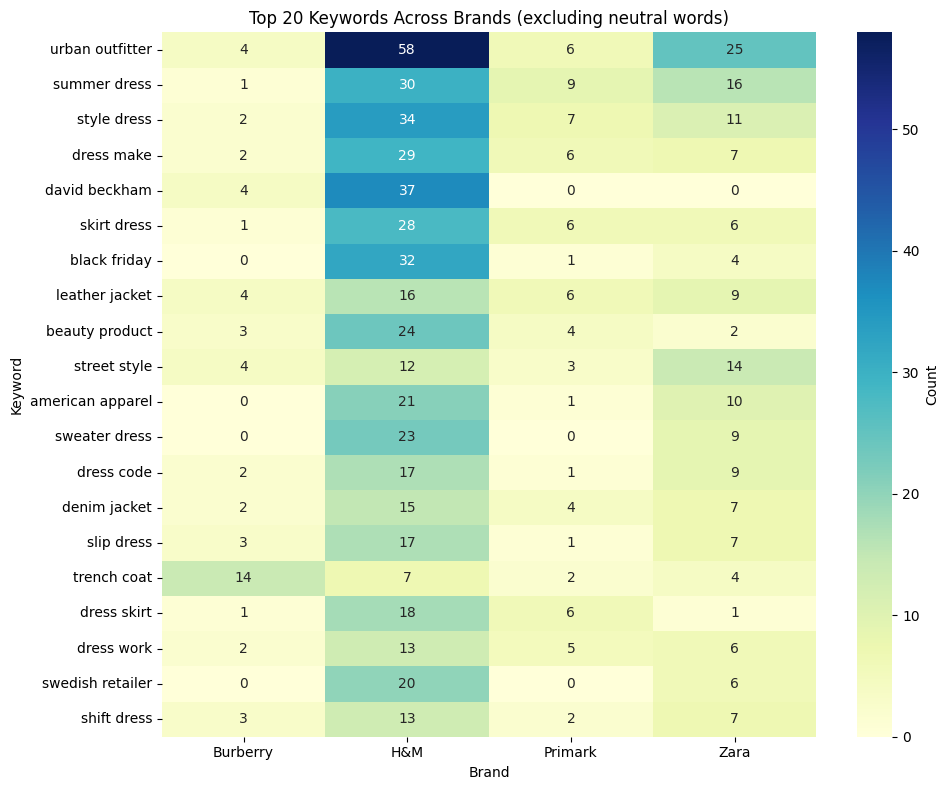

In [ ]:
# Build long-form DataFrame
rows = []
for key, kws in brand_keywords.items():
    label = display_names.get(key, key)
    for kw, cnt in Counter(kws).items():
        if kw not in neutral_words:
            rows.append((label, kw, cnt))
df = pd.DataFrame(rows, columns=['brand', 'keyword', 'count'])

# Pivot to matrix
pivot = df.pivot_table(
    index='keyword',
    columns='brand',
    values='count',
    fill_value=0
)

# Keep only top 20 keywords
top20 = pivot.sum(axis=1).nlargest(20).index
pivot = pivot.loc[top20]

# Plot heatmap with a smooth sequential palette
plt.figure(figsize=(10, 8))
sns.heatmap(
    pivot,
    annot=True,
    fmt=".0f",         # integer‐style formatting
    cmap="YlGnBu",     # smooth yellow→green→blue
    cbar_kws={'label': 'Count'}
)
plt.title("Top 20 Keywords Across Brands (excluding neutral words)")
plt.ylabel("Keyword")
plt.xlabel("Brand")
plt.tight_layout()
plt.show()

-- End of the notebook --